# Treasure Hunt Game Notebook

## Read and Review Your Starter Code
The theme of this project is a popular treasure hunt game in which the player needs to find the treasure before the pirate does. While you will not be developing the entire game, you will write the part of the game that represents the intelligent agent, which is a pirate in this case. The pirate will try to find the optimal path to the treasure using deep Q-learning. 

You have been provided with two Python classes and this notebook to help you with this assignment. The first class, TreasureMaze.py, represents the environment, which includes a maze object defined as a matrix. The second class, GameExperience.py, stores the episodes – that is, all the states that come in between the initial state and the terminal state. This is later used by the agent for learning by experience, called "exploration". This notebook shows how to play a game. Your task is to complete the deep Q-learning implementation for which a skeleton implementation has been provided. The code blocs you will need to complete has #TODO as a header.

First, read and review the next few code and instruction blocks to understand the code that you have been given.

In [282]:
from __future__ import print_function
import os, sys, time, datetime, json, random
import numpy as np
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.optimizers import SGD , Adam, RMSprop
from keras.layers.advanced_activations import PReLU
import matplotlib.pyplot as plt
from TreasureMaze import TreasureMaze
from GameExperience import GameExperience
%matplotlib inline

The following code block contains an 8x8 matrix that will be used as a maze object:

In [283]:
maze = np.array([
    [ 1.,  0.,  1.,  1.,  1.,  1.,  1.,  1.],
    [ 1.,  0.,  1.,  1.,  1.,  0.,  1.,  1.],
    [ 1.,  1.,  1.,  1.,  0.,  1.,  0.,  1.],
    [ 1.,  1.,  1.,  0.,  1.,  1.,  1.,  1.],
    [ 1.,  1.,  0.,  1.,  1.,  1.,  1.,  1.],
    [ 1.,  1.,  1.,  0.,  1.,  0.,  0.,  0.],
    [ 1.,  1.,  1.,  0.,  1.,  1.,  1.,  1.],
    [ 1.,  1.,  1.,  1.,  0.,  1.,  1.,  1.]
])

This helper function allows a visual representation of the maze object:

In [284]:
def show(qmaze):
    plt.grid('on')
    nrows, ncols = qmaze.maze.shape
    ax = plt.gca()
    ax.set_xticks(np.arange(0.5, nrows, 1))
    ax.set_yticks(np.arange(0.5, ncols, 1))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    #print ('DEBUG: qmaze.state =', qmaze.state)
    canvas = np.copy(qmaze.maze)
    for row,col in qmaze.visited:
        canvas[row,col] = 0.6
    pirate_row, pirate_col, _ = qmaze.state
    canvas[pirate_row, pirate_col] = 0.3   # pirate cell
    canvas[nrows-1, ncols-1] = 0.9 # treasure cell
    img = plt.imshow(canvas, interpolation='none', cmap='gray')
    return img

The pirate agent can move in four directions: left, right, up, and down. 

While the agent primarily learns by experience through exploitation, often, the agent can choose to explore the environment to find previously undiscovered paths. This is called "exploration" and is defined by epsilon. This value is typically a lower value such as 0.1, which means for every ten attempts, the agent will attempt to learn by experience nine times and will randomly explore a new path one time. You are encouraged to try various values for the exploration factor and see how the algorithm performs.

In [285]:
LEFT = 0
UP = 1
RIGHT = 2
DOWN = 3


# Exploration factor
epsilon = 0.1

# Actions dictionary
actions_dict = {
    LEFT: 'left',
    UP: 'up',
    RIGHT: 'right',
    DOWN: 'down',
}

num_actions = len(actions_dict)


The sample code block and output below show creating a maze object and performing one action (DOWN), which returns the reward. The resulting updated environment is visualized.

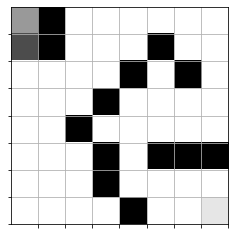

In [286]:
qmaze = TreasureMaze(maze)
canvas, reward, game_over = qmaze.act(DOWN)
#print("DEBUG: reward=", reward)
show(qmaze)

This function simulates a full game based on the provided trained model. The other parameters include the TreasureMaze object and the starting position of the pirate.

In [287]:
def play_game(model, qmaze, pirate_cell):
    qmaze.reset(pirate_cell)
    envstate = qmaze.observe()
    while True:
        prev_envstate = envstate
        #print('DEBUG: envstate', envstate)
        #action_new = np.argmax(experience.predict(prev_envstate))
        #print('DEBUG: action_new', action_new)
        # get next action
        
        # TODO: model.predict is not working properly as it is predicting the same action with each loop
        #       not sure if it is the model itself or the 'prev_envstate' parameter
        q = model.predict(prev_envstate)
        #print('DEBUG: q=', q)
        #action = random.choice(qmaze.valid_actions())

        action = np.argmax(q[0])
        #CLN: DEBUG
        print('DEBUG: play_game action', action)
        
        # apply action, get rewards and new state
        envstate, reward, game_status = qmaze.act(action)
        if game_status == 'win':
            #print('DEBUG: game_stauts=', game_status)
            return True
        elif game_status == 'lose':
            #print('DEBUG: game_stauts=', game_status)
            return False

This function helps you to determine whether the pirate can win any game at all. If your maze is not well designed, the pirate may not win any game at all. In this case, your training would not yield any result. The provided maze in this notebook ensures that there is a path to win and you can run this method to check.

In [288]:
def completion_check(model, qmaze):
    for cell in qmaze.free_cells:
        if not qmaze.valid_actions(cell):
            return False
        if not play_game(model, qmaze, cell):
            return False
    return True

The code you have been given in this block will build the neural network model. Review the code and note the number of layers, as well as the activation, optimizer, and loss functions that are used to train the model.

In [289]:
def build_model(maze):
    model = Sequential()
    model.add(Dense(maze.size, input_shape=(maze.size,)))
    model.add(PReLU())
    model.add(Dense(maze.size))
    model.add(PReLU())
    model.add(Dense(num_actions))
    model.compile(optimizer='adam', loss='mse')
    return model

# #TODO: Complete the Q-Training Algorithm Code Block

This is your deep Q-learning implementation. The goal of your deep Q-learning implementation is to find the best possible navigation sequence that results in reaching the treasure cell while maximizing the reward. In your implementation, you need to determine the optimal number of epochs to achieve a 100% win rate.

You will need to complete the section starting with #pseudocode. The pseudocode has been included for you.

In [290]:
def qtrain(model, maze, **opt):

    # exploration factor
    global epsilon 
    
    # number of epochs
    #n_epoch = opt.get('n_epoch', 15000)
    
    #CLN: correcrted keyname for funtion call arg
    n_epoch = opt.get('epochs', 15000)

    # maximum memory to store episodes
    max_memory = opt.get('max_memory', 1000)

    # maximum data size for training
    data_size = opt.get('data_size', 50)

    # start time
    start_time = datetime.datetime.now()

    # Construct environment/game from numpy array: maze (see above)
    qmaze = TreasureMaze(maze)

    # Initialize experience replay object
    experience = GameExperience(model, max_memory=max_memory)
    
    win_history = []   # history of win/lose game
    hsize = qmaze.maze.size//2   # history window size
    win_rate = 0.0
    
    # pseudocode:
    # For each epoch:
    #    Agent_cell = randomly select a free cell
    #    Reset the maze with agent set to above position
    #    Hint: Review the reset method in the TreasureMaze.py class.
    #    envstate = Environment.current_state
    #    Hint: Review the observe method in the TreasureMaze.py class.
    #    While state is not game over:
    #        previous_envstate = envstate
    #        Action = randomly choose action (left, right, up, down) either by exploration or by exploitation
    #        envstate, reward, game_status = qmaze.act(action)
    #    Hint: Review the act method in the TreasureMaze.py class.
    #        episode = [previous_envstate, action, reward, envstate, game_status]
    #        Store episode in Experience replay object
    #    Hint: Review the remember method in the GameExperience.py class.
    #        Train neural network model and evaluate loss
    #    Hint: Call GameExperience.get_data to retrieve training data (input and target) and pass to model.fit method 
    #          to train the model. You can call model.evaluate to determine loss.
    #    If the win rate is above the threshold and your model passes the completion check, that would be your epoch.
    
    #print('DEBUG: maze =', maze)
    #print('Current epoch is: ', end='')  
    for cur_epoch in range(n_epoch):
        # set vars for current epoch (used in report below)
        loss = 0
        n_episodes = 0
        
        print('DEBUG: current epoch =', cur_epoch)
        # Agent_cell = randomly select a free cell, 2-tuple with range of 0-7 from the constructor's free_cells var
        pirate_cell = random.choice(qmaze.free_cells)
        #print('DEBUG: random pirate_cell =', pirate_cell)
   
        # Reset the maze with agent set to above position (pirate_cell)
        qmaze.reset(pirate_cell)
        
        # envstate = Environment.current_state
        envstate = qmaze.observe()
        #print('DEBUG: envstate', envstate)
        #print('DEBUG: matrix cell value =', maze[pirate_cell[0], pirate_cell[1]])
        
        #valid_actions = qmaze.valid_actions()
        #print('DEBUG: valid_actions', valid_actions)
        
        # While game state is not game over:
        while qmaze.game_status() == 'not_over':
            
            # CLN: 6/14/22 implemented professor Susalla's recommendations (enumerated below):
            # 1. Set valid_actions
            # 2. Break if not a valid action
            # 3. Set prev_envstate
            # 4. Get next action
            # 5. Apply action, get reward and new envstate
            # 6. Store episode (experience)
            # 7. Train neural network model
            # 8. Evaluate win_rate
            
            # 1. set valid actions based on the pirate's current position
            valid_actions = qmaze.valid_actions()
            #print('DEBUG: valid_actions', valid_actions)
            
            # 3. Set prev_envstate
            previous_envstate = envstate
            
            # 4. Get next action
            # action = choose a valid action (left, right, up, down) by random exploration every 1 out of 10 epochs 
            # else, exploit action from experience
            if (cur_epoch % (epsilon * 100)) == 0:
                action = random.choice(valid_actions)
                #print('DEBUG: explore action', action)
            # else exploit
            else:
                action = np.argmax(experience.predict(previous_envstate))
                # ensure predicted action is a valid action
                # 2. Break if predicted action not a valid action
                if action not in valid_actions:
                    break
                else:
                    #print('DEBUG: exploit action', action)
                    pass
           
            # increment n_episodes after taking action
            n_episodes+=1
            
            # 5. Apply action, get reward and new envstate
            # call the act function based on the action to return envstate, reward, and game_status (win, lose, or not_over)
            envstate, reward, game_status = qmaze.act(action)
                      
            # assign the episode data struct
            episode = [previous_envstate, action, reward, envstate, game_status]
            #print('DEBUG: episode =', episode)
            
            # 6. Store episode (experience)
            # Store episode in Experience replay object
            experience.remember(episode)
            
            # get Experience replay data
            inputs, targets = experience.get_data()
            
            # 7. Train neural network model
            # Train neural network with model.fit
            model.fit(inputs, targets, epochs=20, verbose=1)
            
            # evaluate loss
            loss = model.evaluate(inputs, targets)
            #print('loss evaluation = ', loss)
            
            # check for win/lose and update metrics repsectively
            if episode[4] == 'win':
                #print('DEBUG: episode result = ', episode[4])
                win_history.append(1)
                #print('DEBUG: win_history =', win_history)
                win_rate = sum(win_history) / len(win_history)
                print('DEBUG: win_rate=', win_rate)   
                break
            elif episode[4] == 'lose':
                #print('DEBUG: episode result = ', episode[4])
                win_history.append(0)
                win_rate = sum(win_history) / len(win_history)
                break
            else:  
                #print('DEBUG: episode result = ', episode[4])
                pass
         
        # If the win rate is above the threshold and your model passes the completion check, that would be your epoch.
        # 8. Evaluate win_rate
        if win_rate > epsilon and completion_check(model, qmaze):
            print('DEBUG: win rate above epsilon at epoch:', cur_epoch)
    
            #Print the epoch, loss, episodes, win count, and win rate for each epoch
            dt = datetime.datetime.now() - start_time
            t = format_time(dt.total_seconds())
            template = "Epoch: {:03d}/{:d} | Loss: {:.4f} | Episodes: {:d} | Win count: {:d} | Win rate: {:.3f} | time: {}"
            print(template.format(cur_epoch, n_epoch-1, loss, n_episodes, sum(win_history), win_rate, t))
            
            # We simply check if training has exhausted all free cells and if in all
            # cases the agent won.
            if win_rate > 0.9 : epsilon = 0.05

            #TODO: completion_check() is not functioning properly because play_game() called inside of it
            #      is using the trained model but it is not making proper predictions
            #print ('DEBUG: win_history', sum(win_history[-hsize:]), 'hsize', hsize)
            if sum(win_history[-hsize:]) == hsize and completion_check(model, qmaze):
            #if sum(win_history[-hsize:]) == hsize:   
                print("Reached 100%% win rate at epoch: %d" % (cur_epoch))
                break
        
    
    
    # Determine the total time for training
    dt = datetime.datetime.now() - start_time
    seconds = dt.total_seconds()
    t = format_time(seconds)

    #print("n_epoch: %d, max_mem: %d, data: %d, time: %s" % (epoch, max_memory, data_size, t))
    #CLN: Corrected variable name for epoch to n_epoch
    print("\n\nn_epoch: %d, max_mem: %d, data: %d, time: %s" % (n_epoch, max_memory, data_size, t))
    return seconds

# This is a small utility for printing readable time strings:
def format_time(seconds):
    if seconds < 400:
        s = float(seconds)
        return "%.1f seconds" % (s,)
    elif seconds < 4000:
        m = seconds / 60.0
        return "%.2f minutes" % (m,)
    else:
        h = seconds / 3600.0
        return "%.2f hours" % (h,)

## Test Your Model

Now we will start testing the deep Q-learning implementation. To begin, select **Cell**, then **Run All** from the menu bar. This will run your notebook. As it runs, you should see output begin to appear beneath the next few cells. The code below creates an instance of TreasureMaze.

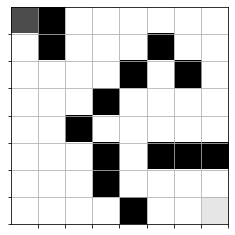

In [291]:
qmaze = TreasureMaze(maze)
show(qmaze)

In the next code block, you will build your model and train it using deep Q-learning. Note: This step takes several minutes to fully run.

In [292]:
model = build_model(maze)
qtrain(model, maze, epochs=500, max_memory=8*maze.size, data_size=32)

DEBUG: current epoch = 0
Epoch 1/20
1/1 [==============================] - 1s 617ms/step - loss: 0.0210
Epoch 2/20
1/1 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 3/20
1/1 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 4/20
1/1 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 5/20
1/1 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 6/20
1/1 [==============================] - 0s 2ms/step - loss: 0.0070
Epoch 7/20
1/1 [==============================] - 0s 2ms/step - loss: 0.0026
Epoch 8/20
1/1 [==============================] - 0s 2ms/step - loss: 1.4428e-04
Epoch 9/20
1/1 [==============================] - 0s 2ms/step - loss: 9.5631e-04
Epoch 10/20
1/1 [==============================] - 0s 3ms/step - loss: 0.0023
Epoch 11/20
1/1 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 12/20
1/1 [==============================] - 0s 3ms/step - loss: 0.0027
Epoch 13/20
1/1 [=====================

Epoch 1/20
6/6 [==============================] - 0s 548us/step - loss: 0.0120
Epoch 2/20
6/6 [==============================] - 0s 668us/step - loss: 0.0100
Epoch 3/20
6/6 [==============================] - 0s 0us/step - loss: 0.0082
Epoch 4/20
6/6 [==============================] - 0s 1ms/step - loss: 0.0080
Epoch 5/20
6/6 [==============================] - 0s 1ms/step - loss: 0.0089
Epoch 6/20
6/6 [==============================] - 0s 487us/step - loss: 0.0094
Epoch 7/20
6/6 [==============================] - 0s 508us/step - loss: 0.0086
Epoch 8/20
6/6 [==============================] - 0s 0us/step - loss: 0.0075
Epoch 9/20
6/6 [==============================] - 0s 0us/step - loss: 0.0072
Epoch 10/20
6/6 [==============================] - 0s 502us/step - loss: 0.0079
Epoch 11/20
6/6 [==============================] - 0s 505us/step - loss: 0.0079
Epoch 12/20
6/6 [==============================] - 0s 0us/step - loss: 0.0076
Epoch 13/20
6/6 [==============================] - 0s 798us/s

Epoch 1/20
10/10 [==============================] - 0s 401us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 210us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 13/20
10/10 [======

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 297us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 12/20
10/10 [=====================

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0063
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 9.1468e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.2284e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.6012e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.4017e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 8.4165e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.1490e-04
Epoch 10/20
10/10

Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0040
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 7/20
10/10 [=====================

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 7.9456e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 7.7256e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 7.8370e-04
Epoch 4/20
10/10 [====

Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.9484e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 9.8447e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 9.9238e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.4227e-04
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 9.4553e-0

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 3.0751e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 4.9621e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 4.6457e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 4.9713e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 4.6333e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 4.7087e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.6598e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.4964e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 4.5003e-04
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 4.4165e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 4.2509e

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.7627e-04
Epoch 7/20
10/10 [===============

Epoch 10/20
10/10 [==============================] - 0s 400us/step - loss: 1.2114e-04
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 1.1714e-04
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 1.0676e-04
Epoch 13/20
10/10 [==============================] - 0s 400us/step - loss: 1.1263e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 1.0616e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.9866e-05
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 1.0427e-04
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 9.6354e-05
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.5253e-05
Epoch 19/20
10/10 [==============================] - 0s 400us/step - loss: 9.4288e-05
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss:

Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 295us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 297us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 18/20
10/10 [=

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 4.8357e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 4.2631e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 4.6940e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 4.2667e-04
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 4.2662e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.2869e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 3.9261e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 4.2443e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 3.7020e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 4.0007e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 3.7031e

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 3.4689e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.4183e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 3.4274e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 3.2187e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 3.3033e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 3.1201e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/20
10/

Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 9.2597e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.6307e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 8.2277e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 7.8834e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.2645e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.5502e-04
Epoch 19/20
10/10 [==============================] - 0s 400us/step - loss: 8

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.6052e-04
Epoch 4/20
10/10 [==============================] - 0s 297us/step - loss: 7.8145e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 8.0639e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 7.6749e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 7.5728e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.3406e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.2857e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 6.9068e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 7.0011e-04
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 6.6322e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 6.6013e-04
Epoch 14/20
10/10 [==============================] - 0s 199us

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 9.6742e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 9.6387e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.3486e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 9.5119e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 9.1782e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 8.9693e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.9793e-04
Epoch 8/20

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 6.6571e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.4141e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 6.0916e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 6.0619e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 5.8907e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 5.6944e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 5.4487e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 5.4751e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 5.1779e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 5.0097e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0

Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 7.8970e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 8.0746e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 7.8123e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 7.6232e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 7.3739e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 7.4266e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 7.0288e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 6.8070e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 6.8158e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 6.3929e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 6.2728e-04
Epoch 16/20
10/10 [==============================] - 0s 300

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 105us/step - loss: 4.6366e-04
Epoch 15/20
10/10 [==============================] - 0s 196us/step - loss: 4.6494e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 4.3332e-04
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 4.2118e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 4.1845e-04
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 3.7944e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 6.8962e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 6.1442e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 6.5750e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 6.3499e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 5.7

Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.9926e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.7282e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 9.4050e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 9.1288e-04
Ep

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [====

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.0163e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.4361e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.8485e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 9.8761e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 9.7642e-04
Epoch 10/20
10/10 [=

Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 9.1247e-04
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 9.2638e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.8201e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 8.0678e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 7/20
10/10 [=====

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 3/20
10/10 [================

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.7005e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 6.3958e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 6.4565e-04
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 6.0531e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 6.0558e-04
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 5.8029e-04
Epoch 11/20
10/10 [==============================] - 0s 105us/step - loss: 5.5474e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 5.5439e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 5.1151e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 5.1431e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 4.8235e-04
Epoch 16/20
10/10 [==============================] - 0s 302

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 9.9789e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 400us/step - loss: 9.6509e-04
Epoch 11/20
10/10 [==============

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 8.3703e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 304us/step - loss: 9.0257e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.6021e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 6/20
10/10 [======

Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 20/20
10/10 

DEBUG: current epoch = 6
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 4.5456e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 4.7900e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 4.6208e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 4.5007e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 4.5132e-04
Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 4.2680e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 4.3708e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 4.0660e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.1198e-04
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 3.9734e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 3.7896e-04
Epoch 12/20
10/10 [===================

Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 9.5093e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 9.1869e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.9175e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 3.0698e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 2.5960e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 2.8572e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 2.7397e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 2.3804e-04
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 2.6265e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 2.3765e-04
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 2.1811

Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 305us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 296us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 9.3636e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.4648e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 9.2798e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.9354e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.2700e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 8.3648e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 7.5372e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 7.8865e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss:

Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 7.3630e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.0247e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.9495e-04
Epoch 19/20
10/10 [==============================] - 0s 99us/step - loss: 6.6836e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 7.7090e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 7.9256e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 7.4092e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.7725e-04
Epoch 5/20
10/10 [==============================] - 0s 404us/step - loss: 7.1180e-04
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 7.3376e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 6.9281

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 3.6957e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 3.3268e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.3847e-04
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 3.1040e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 3.1594e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 2.8770e-04
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 2.8736e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 2.7726e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 2.5631e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.00

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 9.7022e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.4564e-04
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 9.1102e-04
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 8.8430e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.7730e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.394

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 5.3649e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 4.8602e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 5.2504e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 4.8591e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 4.8462e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 4.7496e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 4.6430e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.5305e-04
Epoch 9/20
10/10 [==============================] - 0s 100us/step - loss: 4.4054e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 4.3226e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 4.1558e-04
Epoch 12/2

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.5999e-04
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 5.3183e-04
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 4.9946e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 4.9692e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [====

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 202us/step
Epoch 1/20
10/10 [==============================] - 0s 105us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 9.4443e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 9.3398e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 9.0529e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.5983e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.4080e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10

Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 9.8747e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 9.6223e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.2833e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.5037e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.8935e-04
E

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 9.3670e-04
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 9.2779e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 9.2770e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 9.0344e-04
Epoch 12/20
10/10 [=================

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.4152e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.0146e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 7.0318e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 9/20
10/10 [=========

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/20
10/10 [===================

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 9.5467e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 8.7653e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 9.6078e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 8.4803e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 8.6875e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 8.2479e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 7.8025e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoc

Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 7.8246e-04
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 7.1803e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.2102e-04
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 6.7281e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 6.7261e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 6.5553e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 6.0557e-04
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 6.0639e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 5.7317e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 5.5191e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.2021e-04
Epoch 17/20
10/10 [==============================] - 0s 20

10/10 [==============================] - 0s 203us/step - loss: 8.9607e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 9.4256e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.5513e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 8.8665e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.3883e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 8.8629e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 8.2398e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.1065e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 7.9047e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 7.5061e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 7.4553e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss:

Epoch 18/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 403us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 305us/step - loss: 0.0020
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 8.6590e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.8014e-04
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 8.3156e-04
Epoch 4/20
10/10 [==============================] - 0s 105us/step - loss: 8.1633e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 7.8859e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 7.6337e-04
Epoch 7/20
10/

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 105us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 99us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [=================

Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 9.2156e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 9.9095e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 9.1039e-04
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 8.9902e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.7599e-04
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 8.4290e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 8.2359e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 7.8622e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.2189e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 7.4407e-04
Epoch 16/20
10/10 [==============================] - 0s 300us/s

Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 9.2441e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 8.8859e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 9.2526e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.0954e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.0059e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.4509e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.6821e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.5241e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 8.3647e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.0760e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 7.9809e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 11/20
10/10 [======================

Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/20
10/10 [=================

Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 9.7859e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.4816e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 9.2973e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 2/20
10/10 [===

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 104us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 399us/step - loss: 6.4481e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.7121e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 5.7993e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 6.2684e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 5.8218e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 5.3086e-04
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 5.3327e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 5.0451e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 4.8764e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 4.6007e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 4.5162e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.6486e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.4293e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 8.9584e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/20
10/10 [=========

Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 6.3446e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 6.2094e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 5.6764e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.8372e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 5.0353e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 5.4239e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 4.6375e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: current epoch = 11
DEBUG: current epoch = 12
DEBUG: current epoch = 13
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 4/20

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 2.4617e-04
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 2.3179e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 2.3757e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 2.3398e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 2.3050e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 2.2418e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 2.1917e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 2.0890e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 2.1562e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 2.0549e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 2.0674e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: current epoch = 19
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.5579e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.5602e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 9.4071e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.8260e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 8.4060e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 7/20
10/10 [

Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.7399e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.8598e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 9.6690e-04
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 8.6764e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.0922e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 8.6412e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.7140e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 7.9459e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 7.4763e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 400us/step - loss: 0.00

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 9.1166e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 9.5065e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.1200e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.6381e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 8.6304e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.3711e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 7.9392e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.7365e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 7.4556e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 6.9921e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 6.8494e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] -

Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 11/20
10/10 [=======================

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 8/20
10/10 [====================

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.9177e-04
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 9.8504e-04
Epoch 16/20
10/10 [==============================] - 0s 297us/step - loss: 9.6854e-04
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 9.4513e-04
Epoch 18/20
10/10 [==============================] - 0s 197us/step - loss: 9.2897e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 9.1536e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 6/20
10

Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.7330e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.6024e-04
Epoch 19/20

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 9.9305e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.9116e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 9.6318e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 9.4031e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.1338e-04
Epo

Epoch 20/20
10/10 [==============================] - 0s 199us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 12/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.7404e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 9.5650e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 9/20
10/10 [==============

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 8.7505e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 8.8057e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 8.1700e-04
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 8.0592e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 7.9969e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.7790e-04
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 7.4574e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 4.2134e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 4.6062e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 4.1842e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 4.59

Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [================

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 304us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 9.6655e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.4720e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.4420e-04
Epoch 15/20

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 206us/step - loss: 0.0012
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 7.5614e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.1993e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 6.9355e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 6.7743e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 6.6990e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 6.3822e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 6.1962e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 2/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [

Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 396us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 401us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 14/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.2766e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [=================

Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 9.9857e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 401us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 7/20
10/10 [================

10/10 [==============================] - 0s 200us/step - loss: 9.9557e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 9.7397e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 9.6125e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.4898e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 9.1957e-04
Epoch 16/20
10/10 [==============================] - 0s 206us/step - loss: 9.1953e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 8.8558e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.7817e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.6056e-04
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 196us/step - loss: 0.0011
Epoch 3/20

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 296us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 298us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 12/20
10/10 [=======================

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.0765e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.6216e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 7.6818e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 298us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 305us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 296us/step - loss: 0.0025
Epoch 9/20
10/10 [=========

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 4.2450e-04
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 4.2903e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 4.1612e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 3.7544e-04
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 3.7166e-04
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 3.6778e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 3.6179e-04
Epoch 20/20
10/10 [==============================] - 0s 96us/step
Epoch 1/20
10/10 [==============================] - 0s 195us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 8.7193e-04
Epoch 3/20
10/10 [==============================] - 0s 401us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 9.0771e-04


Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [================

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 306us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 294us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 7.7636e-04
Epoch 4/20
10/10 [==============================] - 0s 298us/step - loss: 7.5806e-04
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 7.5697e-04
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 7.5713e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 7.3620e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.2493e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 7.0613e-04
Epoch 10/20
10/10 [==============================] - 0s 197us/step - loss: 7.0355e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 6.8854e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 6.7314e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 6.5276e-04
Epoch 14/20
10/10 [==============================] - 0s 206us

DEBUG: play_game action 1
DEBUG: current epoch = 27
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 29
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 9.3878e-04
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 8.5949e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.2964e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 8.9877e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.7113e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.8293e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 7.6794e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 7.2003e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 6.4134e-04
E

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.7646e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 195us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 4/20
10/10 [============

Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 5.8141e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 5.4488e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 5.3227e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 5.4064e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 5.1850e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 5.0062e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 4.9301e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 4.8780e-04
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 4.6754e-04
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 4.6047e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 4.5446e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 6.1798e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 5.5178e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 6.7314e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 6.6442e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 5.3900e-04
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 5.5081e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 6.0329e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 5.4086e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 4.9806e-04
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 5.3231e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 5.1916e-04
Epoch 12/2

Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0060
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0049
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 17/20
10/10 [==============================] - 0s 98us/step - loss: 0.0030
Epoch 18/20
10/10 [==============================] - 0s 296us/step - loss: 0.0031
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 7/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 399us/step - loss: 3.9176e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 3.7867e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.6154e-04
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 3.7432e-04
Epoch 16/20
10/10 [==============================] - 0s 319us/step - loss: 3.5824e-04
Epoch 17/20
10/10 [==============================] - 0s 194us/step - loss: 3.5616e-04
Epoch 18/20
10/10 [==============================] - 0s 255us/step - loss: 3.4242e-04
Epoch 19/20
10/10 [==============================] - 0s 214us/step - loss: 3.4319e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Ep

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 19/20
10/10 [

10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 9.9252e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 9.9193e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 9.5041e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 9.5202e-04
Epoch 16/20
10/10

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 

Epoch 18/20
10/10 [==============================] - 0s 402us/step - loss: 8.0196e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 7.9366e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 398us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 10/20
10/10 [==============

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 19/20
10/10 [==============================] - 0s 801us/step - loss: 0.0028
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 0.0169
Epoch 2/20
10/10 [==============================] - 0s 321us/step - loss: 0.0161
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0166
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0156
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0154
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 0.0153
Epoch 7/20
10/10 [=======================

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 401us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 9.5585e-04
Epoch 17/20
10/10 [==============================] - 0s 403us/step - loss: 9.4148e-04
Epoch 18/20
10/10 [==============================] - 0s 400us/step - loss: 8.8342e-04
Epoch 19/20
10/10 [==============================] - 0s 400us/step - loss: 8.6820e-04
Epoch 20/20
10/10 [==============================] - 0s 203us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 5.8813e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 6.1688e-04
Epoch 3/2

Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.9346e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.0201e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 7.6461e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 9.3475e-04
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.3329e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 9.1477e-04
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 9.1274e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 8.3386e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.5658e-04
Epo

Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 9.9346e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 9.9948e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 9.5451e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.6414e-04
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 9.5654e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.1934e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 503us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 6/20
10/

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0079
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0067
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0068
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0048
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 2/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 402us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 401us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 402us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 400us/step - loss: 0.0020
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 305us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 9.8790e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 9.9357e-04
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 9.6554e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 9.4236e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.8049e-04
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 9.2994e-04
Epoch 12/20
10/10 [=========

Epoch 17/20
10/10 [==============================] - 0s 401us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 402us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 200us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 206us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 7.5122e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 211us/step - loss: 7.7888e-04
Epoch 5/20
10/10 [==========

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 3.5030e-04
Epoch 10/20
10/10 [==============================] - 0s 215us/step - loss: 3.7753e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.4265e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 3.0767e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 3.2589e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.0748e-04
Epoch 15/20
10/10 [==============================] - 0s 313us/step - loss: 2.9568e-04
Epoch 16/20
10/10 [==============================] - 0s 286us/step - loss: 3.0333e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 2.9112e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 2.7144e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 2.7067e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 219us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 9.5843e-04
Epoch 14/20
10/10 [==============================] - 0s 207us/step - loss: 9.0600e-04
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 8.3981e-04
Epoch 16/20

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.4812e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 9.6780e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 9.4547e-04
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 9.1379e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 8.8785e-04
Epoch 12/20
10/10 [==

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 9.1957e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 9.6308e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 9.4541e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 8.4649e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 8.4025e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 8.6521e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.0032e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 7.5848e-04
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 7.7888e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 7.5891e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss:

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 19/20
10/10 [=

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 402us/step - loss: 0.0016
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 14/20
10/10 [=====

10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0033
Epoch 4/20
10/10 [==============================] - 0s 304us/step - loss: 0.0033
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0032
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0031
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0030
Epoch 12/20
10/10 [==============================] - 0s 400us/step - loss: 0.0029
Epoch 13/20
10/10 [=================

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 3.9486e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 4.0797e-04
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 3.6775e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1


DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 37
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================]

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game acti

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.6497e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 3.0639e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 3.9787e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 3.4505e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 4.0331e-04
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 2.9969e-04
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 3.3864e-04
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 3.0181e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.5229e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 2.8825e-04
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 3.0181e-04
Epoch 17/20
10/10 [==============================] - 0s 20

Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 305us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [======

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 8.6406e-04
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 7.5779e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 6.6586e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 6.2962e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 5.3892e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 6.0119e-04
Epoch 11/20
10/10

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 8.3546e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 9.2257e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.0561e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.8182e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.8640e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 8.3286e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/

Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 9.9593e-04
Epoch 20/20
10

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 17/20
10/10 [==

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0029
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 400us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.8579e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 9.6078e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 5.5192e-04
Epoch 2/20
10/10 [==============================] - 0s 400us/step - loss: 4.8651e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 5.1289e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 5.2533e-04
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 4.6658e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.8092e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 4.7230e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 4.5305e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.4914e-0

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/20
10/10 [===================

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 9.6357e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 8.8057e-04
Epoch 3/20
10/10 [========

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.3277e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 4.0630e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 3.9576e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 3.8990e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.6111e-04
Epoch 12/20
10/10 [==============================] - 0s 304us/step - loss: 3.4721e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.5871e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 3.3099e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 3.0077e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 3.1300e-04
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 3.0274e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 196us/step - loss: 0.0026
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] -

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 305us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 203us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 601us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 8.1863e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 8.7876e-04
Epoch 5/20
10/10 [=========

Epoch 7/20
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 398us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 306us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 400us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 16/20
10/10 [===

Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 401us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [======

Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 7.2777e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 8.0541e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 6.9177e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 401us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [=========

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 4.9443e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 4.7491e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 4.5748e-04
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 4.6173e-04
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 4.5013e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 4.2679e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 4.2254e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 399us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 5

Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 7.3479e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.2641e-04
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 7.1331e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 6.4787e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 6.6112e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 6.5897e-04
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 6.0733e-04
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 5.9915e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 5.7968e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 5.6713e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss:

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.8758e-04
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 8.6747e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 8.1903e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 8.2190e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 7.9352e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 7.3226e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.2957e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 6.9776e-04
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 6.6912e-04
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 6.6599e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 6.3598e-04
Epoch 16/20
10/10 [==============================] - 0s 201

Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.9647e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.1228e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.9835e-04
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 8.4212e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 7.6906e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 7.6882e-04
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 7.0303e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 6.6009e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss:

Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 5.6300e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 4.4802e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 5.4291e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 5.9622e-04
Epoch 5/20
10/10 [==============================] - 0s 304us/step - loss: 4.9882e-04
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 4.5796e-04
Epoch 7/20
10/

Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 9.9353e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.8342e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.0642e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.1867e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 8.8608e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 8.8608e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 8.3003e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 397us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 499us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 9.7947e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.4606e-04
Epoch 10/20
10/10 [==============================] - 0s 402us/step - loss: 9.8907e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.4273e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 9.2644e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 9.0096e-04


DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] -

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.8326e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 3.6464e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 4.0333e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 3.6159e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 3.6342e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 9.1074e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.7514e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.4228e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 9.3677e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.6712e-0

Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 2.7045e-04
Epoch 11/20
10/10 [==============================] - 0s 206us/step - loss: 2.5791e-04
Epoch 12/20
10/10 [==============================] - 0s 98us/step - loss: 2.3880e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 2.5017e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 2.0533e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 2.4246e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 1.8516e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 2.2024e-04
Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 1.7665e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 1.9747e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 4.6250e-04
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 4.7876e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.0745e-04
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 4.3230e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 4.2110e-04
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 3.7826e-04
Epoch 11/20
10/10 [==============================] - 0s 98us/step - loss: 3.9713e-04
Epoch 12/20
10/10 [==============================] - 0s 196us/step - loss: 3.6424e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 3.6419e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 3.7422e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 3.3847e-04
Epoch 16/20
10/10 [==============================] - 0s 299u

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 5.9116e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 4.9040e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 4.5676e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 5.0709e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.3918e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.2066e-04
Epoch 7/20
10/

Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 97us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.9652e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.7340e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.4806e-04
Epoch 19/20
10/10 [==============================] - 0s 206us/step - loss: 9.3028e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 799us/step - loss: 0.0022
Epoch 3/20
10/10 [

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 8.6071e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 6.0366e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 8.1471e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.2079e-04
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 6.3472e-04
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 7.6131e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 6.2150e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 6.5123e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 6.8430e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 5.8280e-04
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 6.3570e

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 53
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 305us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 10/20
10/10 [==================

Epoch 15/20
10/10 [==============================] - 0s 401us/step - loss: 8.9389e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.8524e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 8.6564e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.5777e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.5600e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 101us/step - loss: 5.2138e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 4.3133e-04
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 4.5715e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 4.2901e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 4.7573e-04
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 4.615

Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 1.7246e-04
Epoch 2/20
10/10 [=============

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 17/20
10/10 [==

Epoch 3/20
10/10 [==============================] - 0s 304us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 101us/step
DEBUG: win_rate= 0.5
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_ga

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 57
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 8.8526e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 7.9654e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.7150e-04
Epoch 5/20
10/10 [=======

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 304us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 106us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 5.6409e-04
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 5.5046e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 5.2726e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 5.2395e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/20
10/10 [====

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 9.8749e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.3682e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 9.3580e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.0465e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 9.0105e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 8.6434e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.5251e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 8.3359e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 7.7280e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.4644e-04
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 7.

Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 16/20
10/10 [=====

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 305us/step - loss: 6.9884e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.8658e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [=============

Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 5.6642e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 5.4453e-04
Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 5.2377e-04
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 5.1056e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 4.9187e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 5.4404e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 5.2717e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 5.0569e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 5.1468e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 4.6412e-04
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 4.5777e-04
Epoch 18/20
10/10 [==============================] - 0s 197us/step - loss: 4.6553e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 4.3139e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 9.9764e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 9.5442e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9

Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 399us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 8.8708e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.6470e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.7465e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.6648e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.3814e-04
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 8.2935e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 8.1274e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 7.9282e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 7.8364e-04
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 7.6678e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 7.5103e-04
Epoch 13/20
10/10 [==============================] - 0s 304us/

Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 8.4719e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 9.6226e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.4351e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 9.4379e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 9.3601e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 9.3223e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.1082e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 9.0210e-04
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 8.9135e-04
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 8.7945e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.6194e

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/20
10/10 [===================

Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 9.4689e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.3334e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.1820e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 9.1595e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 8.9637e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.8299e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.7493e-04
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 8.6175e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Ep

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [================

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 402us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 402us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 401us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 7.7293e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.8833e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.4833e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 9.0424e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 9.3995e-04
Epoch 3/20
10/10 [==============================] - 0s 402us/step - loss: 9.1061e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.8024e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.4151e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 8.5936e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.9348e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 8.5078

Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/20
10/10 [================

Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 5.4417e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 5.4067e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 5.3317e-04
Epoch 4/20
10/10 [==============================] - 0s 296us/step - loss: 4.6225e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.3136e-04
Epoch 6/20
10/10 [==============================] - 0s 304us/step - loss: 3.9779e-04
Epoch 7/20
10/10 [==============================] - 0s 297us/step - loss: 4.7305e-04
Epoch 8/20
10/10 [==============================] - 0s 99us/step - loss: 3.9036e-04
Epoch 9/20
10/10 [==============================] - 0s 105us/step - loss: 3.9446e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 3.7951e-04
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 3.3590e-04
Epoch 12/

Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 7.5402e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 7.4761e-04
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 7.4363e-04
Epoch 18/20
10/10 [==============================] - 0s 297us/step - loss: 7.3540e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 7.3008e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 7/20
10/10 

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/20
10/10 [=================

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 20/20
10/10 

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 18/20
10/10 [=

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 3/20
10/10 [==============================] - 0s 701us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 2.7560e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 70
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/20
10/10 [=========================

Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 9.9389e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 9.6480e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.7318e-04
Epoch 4/20
10/10 [====

Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 105us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 9.8398e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 9.6774e-04
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 9.5871e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.3277e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 9.1943e-0

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.5359e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.9911e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.8173e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.5252e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.4390e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.3832e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.2924e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 8.0365e-04
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 8.1132e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 8.1270e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.8975e-04
Epoch 15/20
10/10 [==============================] - 0s 201u

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.5272e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 7.3096e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 10/20
10/10 [=============

Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [=====================

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.9449e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 9.7829e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 9.4962e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.1918e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.0674e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 8.8639e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0127
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0107
Epoch 3/2

Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 5.4935e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.4257e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 4.6808e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 4.7853e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 4.5898e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 4.3085e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 3.9091e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 3.9016e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 3.7761e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 3.4575e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 3.5401e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 8.3447e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.6723e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 8.3892e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 7.6129e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 7.3141e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.3379e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 6.8664e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 6.7374e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 6.6814e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 6.1865e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 5.8697e-04
Epoch 14/20
10/10 [==============================] - 0s 203us

Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 5.5924e-04
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 5.2424e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [=============

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 9.9941e-04
Epoch 6/20
10/10 [================

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 8.3531e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 8.0265e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 7.8354e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 7.5284e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 7.1047e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 6.9940e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 6.6720e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 6.4309e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 6.1899e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 5.9606e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 

Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 3.3923e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 3.3684e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 3.3444e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.2971e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 2.9411e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 2.9187e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 2.9934e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 2.8897e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 2.8134e-04
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 2.6755e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 2.6628e-04
Epoch 16/20
10/10 [==============================] - 0s 101

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.1578e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 7.5590e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 5.2221e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 5.4865e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 5.0686e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 5.3326e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 4.6390e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 4.4217e-04
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 4.5061e-04
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 3.9358e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 4.0741e

10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 4/20
10/10 [============================

Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 7.1869e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 6.1122e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 6.5095e-04
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 6.4203e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 6.2398e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 6.1851e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 5.5975e-04
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 5.6827e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 5.4044e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 4.8227e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 4.8521e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 16/20
10/10 [===

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 304us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 9.3023e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 8.3696e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.5431e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.4815e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.0552e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.5328e-04
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 8.3751e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.4198e-04
Epoch 9

Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 404us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [===============

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0040
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 12/20
10/10 [==============================] -

Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 9.8823e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==================

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 9.9432e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 7.0250e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 9.7991e-04
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 7.3778e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 7.3819e-04
Epoch 6/20
10/10 

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.9208e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==========

Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 18/20
10/10 [=

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 195us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 6.6768e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 6.7021e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 6.7684e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 7.5306e-04
Epoch 2/20
10/10 [==============================] - 0s 500us/step - loss: 6.1930e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.1025e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 5.9838e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 5.6804e-04
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 4.4329e-04
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 4.9811e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.9091

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.9760e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.9806e-04
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 3.8861e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 3.7047e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 3.7616e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 3.6361e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 3.5757e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game ac

Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 206us/step - loss: 4.0050e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 9.3218e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 2.7602e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 6.4175e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 2.2791e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 5.5701e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 2.4482e-04
Epoch 16/20
10/10 [==============================] - 0s 297us/step - loss: 4.4662e-04
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 2.3308e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 4.0550e-04
Epoch 19/20
10/10 [==============================] - 0s 199u

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.0589e-04
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 8.4073e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.1317e-04
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 7.8157e-04
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 6.8722e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 6.9570e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 6.4077e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 6.1441e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 6.3121e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 5.5293e-04
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 5.5627e-04
Epoch 15/20
10/10 [==============================] - 0s 202u

Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 6.3668e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 6.3505e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 6.3220e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [====================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 77
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 304us/

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 19/20
10/10 [=

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.5332e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 8.1785e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/20
10/10 [===============

Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 6.8850e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 4.1769e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 5.7804e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.0419e-04
Epoch 7/20
10/10 [====

Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 8.4474e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 9.9302e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.5130e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.4278e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 9.3401e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 9.9453e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.4468e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.4724e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 7.8426e-04
Epoch 19/20
10/10 [==============================] - 0s 699us/step - loss: 7.407

Epoch 3/20
10/10 [==============================] - 0s 99us/step - loss: 2.8233e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 2.8733e-04
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 2.4219e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 2.5246e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 2.5710e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 2.4040e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 2.1808e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 2.3675e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 2.1122e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 2.0348e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 1.9992e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/

Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 8.4758e-04
Epoch 20/20
10/10 [==============================] - 0s 95us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 11/20
10/10 [==================

Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 9.7078e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.7301e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 304us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 7/20
10/10 [===========

Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 402us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 9.4993e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.9291e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.9392e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 296us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 4/20
10/10 [====

Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 7.2480e-04
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 6.8611e-04
Epoch 10/20
10/10 [==============================] - 0s 401us/step - loss: 6.6713e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 6.6052e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 6.4172e-04
Epoch 13/20
10/10 [==============================] - 0s 400us/step - loss: 6.2629e-04
Epoch 14/20
10/10 [==============================] - 0s 304us/step - loss: 6.2742e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 6.2299e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 6.0408e-04
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 5.8838e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 5.8168e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 6.2050e-04
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 6.1664e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 6.3024e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.0153e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 5.8567e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 5.7374e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.6347e-04
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 5.6674e-04
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 5.3301e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 5.1774e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 5.1215e-04
Epoch 14/20
10/10 [==============================] - 0s 302us

Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 11/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 2.1730e-04
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 2.1869e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 2.1382e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 2.0214e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 2.0394e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 1.9445e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/20
10

Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 403us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 2/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.8256e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.3527e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 7.3722e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 7.4000e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 7.5618e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 6.9135e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 7.0889e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 6.6866e-04
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 6.5321e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 6.4247e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 6.1385e-04
Epoch 18/20
10/10 [==============================] - 0s 202

Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0104
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0082
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0079
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0044
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 14/20
10/10 [=====

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 2.8018e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 2.2833e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 2.8701e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 2.0749e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 2.7219e-04
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 2.3871e-04
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 1.7951e-04
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 2.3788e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 1.9071e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 1.9556e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 2.0228e

Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 402us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 7.2207e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 6.2907e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 6.9998e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 6.3969e-04
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 6.5367e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 6.2279e-04
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 5.9743e-04
Epoch 8/20

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.1861e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 5.4123e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 5.8515e-04
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 5.2432e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 5.4885e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 5.0484e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 5.1332e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 4.8324e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 4.8224e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.00

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 5.3331e-04
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 5.2081e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 5.5502e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 5.0255e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 4.8505e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 4.9676e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 4.8523e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.6802e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 4.5105e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 4.4724e-04
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 4.3193e-04
Epoch 12/2

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 297us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [======================

Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 5/20
10/10 [=================

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 9.6269e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.3201e-04
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 8.6904e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 8.4300e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.1734e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.8183e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/20

Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 104us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 9.6759e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 9.8989e-04
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 9.3235e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.9914e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.5210e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.7700e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.4933e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.9062e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 7.6724e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 7.6820e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/ste

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 6.6481e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.7863e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 9.1151e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 9.9342e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 8.5913e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 9.5516e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.1087e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.0918e-04
Epoch 11

Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 9.4602e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.1757e-04
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 9.7797e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 7/20
10/10 [========

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 9.9492e-04
Epoch 3/20
10/10 [==============================] - 0s 106us/step - loss: 0.0011
Epoch 4/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 0us/step - loss: 9.4094e-04
Epoch 10/20
10/10 [==============================] - 0s 0us/step - loss: 9.4838e-04
Epoch 11/20
10/10 [==============================] - 0s 0us/step - loss: 9.3017e-04
Epoch 12/20
10/10 [==============================] - 0s 0us/step - loss: 9.2004e-04
Epoch 13/20
10/10 [==============================] - 0s 0us/step - loss: 9.1875e-04
Epoch 14/20
10/10 [==============================] - 0s 2ms/step - loss: 9.0348e-04
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 8.9506e-04
Epoch 16/20
10/10 [==============================] - 0s 0us/step - loss: 8.8635e-04
Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 8.8061e-04
Epoch 18/20
10/10 [==============================] - 0s 0us/step - loss: 8.6841e-04
Epoch 19/20
10/10 [==============================] - 0s 2ms/step - loss: 8.5954e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: pla

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 15/20
10/10 [===============

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 403us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 397us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 9.0677e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 8.8093e-04
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 8.9181e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.1997e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 8.3180e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.7433e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.1330e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 5

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [=================

Epoch 19/20
10/10 [==============================] - 0s 304us/step - loss: 6.6986e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/20
10/10 [==============================] - 0s 698us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 11/20
10/10 [==================

Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 7.4087e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 8.0122e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 6.9998e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 6.9684e-04
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 6.4516e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 6.1256e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 5.8141e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 9.7860e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 3.9823e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 4.1157e-04
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 3.5833e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 3.1783e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 2.9640e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 2.9789e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 2.5701e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 2.2434e-04
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 2.6226e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 2.3835e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 2.0853e-04
Epoch 18/20
10/10 [==============================] - 0s 1

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.4632e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 9.8903e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.6686e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 9.1170e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 8.9329e-04
Epoch 12/20
10/10 [=

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.9511e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 9.4992e-04
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 9.5965e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 7/20
10/10 [=======

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.4179e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.3693e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 8.2174e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 8.1645e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.0603e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 7.9410e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.9009e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 7.8248e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 7.7634e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.002

Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 20/20
10/10 

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 309us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 298us/step - loss: 9.7246e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.6169e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 9.2453e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 9.1043e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 8.7601e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.8087e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 8.3492e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 8.3927e-04
Epoch 12

Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 2.1027e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 2.2154e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 2.0256e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 2.0646e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 1.9594e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 1.8764e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 1.9321e-04
Epoch 20/20
10/10 [==============================] - 0s 105us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 5

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 600us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 9.6917e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.3506e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.1783e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.7787e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 8.7245e-04
Epoc

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 2.7259e-04
Epoch 16/20
10/10 [==============================] - 0s 196us/step - loss: 2.7160e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.7305e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 2.5492e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 2.5334e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 9.9823e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 9.7089e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 9.7338e-04
Epoch

10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 3/20
10/10 [============================

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 1.9075e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 2.0095e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 1.9808e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 1.8665e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 1.7166e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 1.7306e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 1.7411e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 1.7150e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 1.6159e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 1.5763e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 1.5924e-04
Epoch 15/20
10/10 [==============================] - 0s 200u

Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 8/20
10/10 [=====================

10/10 [==============================] - 0s 201us/step - loss: 4.5611e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 4.6215e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 4.2770e-04
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 4.3558e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 4.2720e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 4.0409e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 4.1018e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 3.9495e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 3.8104e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 3.4180e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 3.1185e-04
Epo

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 9.8858e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 9.8010e-04
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 9.7918e-04
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 9.7768e-04
Epo

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 5.0225e-04
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 5.2600e-04
Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 5.0658e-04
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 4.8178e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 4.9811e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 4.6801e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 4.7615e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 4.5389e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 4.4370e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 4.4584e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 4.2542e-04
Epoch 15/20
10/10 [==============================] - 0s 200u

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.6847e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0035
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 4/20
10/10 [==============================] - 0s 105us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/20
10/10 [=================

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.1369e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.0925e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.5832e-04
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 8.2180e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 7.9168e-04
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 7.8236e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.3783e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 7.0432e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Ep

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 8.6785e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.1009e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.0387e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 8.1971e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 8.1405e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 7.4640e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 7.7344e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.3604e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 6.8527e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.1138e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 6.7244e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0059
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0066
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0048
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0

Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 9.5714e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.4257e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.2464e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 9.0675e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 7.8244e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 6.9648e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.7029e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 6.8076e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 6.6034e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 6.4460e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 6.186

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 6.5058e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 6.8249e-04
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 6.8369e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 6.2412e-04
Epoch 16/20
10/10 [==============================] - 0s 296us/step - loss: 5.7650e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 5.6647e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 5.8673e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 5.8978e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Ep

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 18/20
10/10 [============

Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 12/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 9/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/20
10/10 [===================

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 5/20
10/10 [=================

10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 8.2476e-04
Epoch 2/20
10/10 [======================

Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 9.9071e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.5037e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.6761e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.5427e-04
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 9.2002e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.2723e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 8.5854e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.5960e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.4576e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.1906e-04
Epoch 18/20
10/10 [==============================] - 0s 103us

Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 4.8333e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 4.5222e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 4.3426e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 4.3761e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 4.0748e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 3.7208e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 3.4417e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 3.4773e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 3.1637e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 2.9995e-04
Ep

Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.5098e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.8737e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.9624e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.7775e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 8.6361e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 8.2498e-04
Epoch 15/20
10/10 [==============================] - 0s 103us/step - loss: 8.1883e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.0029e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.6507e-04
Epoch 18/20
10/10 [==============================] - 0s 799us/step - loss: 7.8256e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.5054e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 17/20
10/10 [==

Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 102us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.9213e-04
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 9.6650e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 9.7400e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 9.5410e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.0676e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 8.9483e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 8.8829e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.48

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 10/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 8.3785e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 8.0825e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 7.9027e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.5682e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.3470e-04
Epoch 19/20
10/10 [==============================] - 0s 402us/step - loss: 7.1203e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 6/20
1

Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 7.2493e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.6100e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 8.1987e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.0325e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.0245e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.5454e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 6.6636e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 7.4890e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 7.1866e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 6.3274e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 6.9261e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 17/20
10/10 [===

Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 14/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 11/20
10/10 [========================

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 98us/step - loss: 0.0024
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 7/20
10/10 [=====================

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 297us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] -

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 8/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 98us/step
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 2
DEBUG: play_game action 3
DEBUG: play_game action 0
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game action 3
DEBUG: play_game actio

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 5.5404e-04
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 5.3899e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 5.1244e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 5.1656e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 4.7765e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 4.7551e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 4.5258e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 4.3497e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 4.1840e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 4.0642e-04
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 3.9034e-04
Epoch 17/20
10/10 [==============================] - 0s 30

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

10/10 [==============================] - 0s 101us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: pl

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 110
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 9.8339e-04
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 9.8805e-04
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0010
Epoch 11/20
10/10 [=====

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 3.0205e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.9652e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 2.8243e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 2.7432e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/20
10/10 [====

Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 9.7427e-04
Epoch 15/20
10/10 [==============================] - 0s 304us/step - loss: 9.9268e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 9.6967e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.7188e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.6534e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.6306e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/20
1

Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 3.4794e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 3.4370e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 4.2675e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.5200e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 3.1501e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 3.6447e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.5680e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 3.0083e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 3.2782e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 3.3214e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 2.9819e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 13/20
10/10 [=================

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 9.6672e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.0913e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 8.8314e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.3383e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 9.1333e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.8693e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.7041e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.5009e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.7286e-04
Epoc

Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 8.0792e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 7.8081e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 7.5344e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 7.4042e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 7.3215e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 7.2377e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 7.0675e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 5.5512e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.4513e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.5114e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 5.2302e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 5.0075e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 4.9626e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.8769e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 4.4079e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 4.6255e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 4.2936e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 4.0855e-04
Epoch 15/20
10/10 [==============================] - 0s 200u

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 3.3990e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 3.3849e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 3.3931e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 3.1153e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 3.3910e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 2.9768e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 3.1499e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.0286e-04
Epoch 9

Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 6/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.8179e-04
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 9.5654e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 9.5803e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 9.0391e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.7833e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 3/20
10

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.5571e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.8290e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.0658e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 7.9313e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.2677e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 7.7336e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 6.9106e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 7.0493e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 6.7854e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 6.3484e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 6.5557e-04
Epoch 14/20
10/10 [==============================] - 0s 301us

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 12/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.6488e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.6971e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.7319e-04
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 8.8289e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 9.0466e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.2308e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.3909e-04
Epoch 9/20


Epoch 13/20
10/10 [==============================] - 0s 399us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 2.0354e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 1.9080e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 1.9083e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 1.8799e-04
Epoch 5/20
10/10 [==============================] - 0s 103us/step - loss: 1.8386e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 1.7563e-04
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 1.6444e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 1.6196e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 1.5527e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 1.4988e-04
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 1.4590e-04
Epoch 12

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.4476e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.3522e-04
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 6.9863e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 7.8695e-04
Epoch 3/20
10/10 [==============================] - 0s 296us/step - loss: 8.7976e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 7.6603e-04
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 8.6895e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 7.7224e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 6.4456e-04
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 7.3909e-04

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 9.2825e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.2260e-04
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 8.7117e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.2663e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 8.2173e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.1198e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 7.9285e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 5/

Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 196us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 305us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 17/20
10/10 [==

Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.1723e-04
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 9.2974e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 9.8552e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.6823e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.9895e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.4497e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.4547e-04
Epoch 10/20
10/10 [==============================] - 0s 197us/step - loss: 8.7569e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.8214e-04
Epoch 12/20
10/10 [==============================] - 0s 104us/step - lo

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.0226e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 8.9062e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 10/20
10/10 [=============

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.3401e-04
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 7.2787e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 7.0662e-04
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 6.9551e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.9112e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 6.8081e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 111
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 201us

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 103us/step
DEBUG: play_game action 2
DEBUG:

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 9.4660e-04
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 9.3336e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 9.1320e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.1235e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.1645e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.0648e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 6/20
1

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [=================

Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 9.0453e-04
Epoch 9/20
10/10 [==============================] - 0s 105us/step - loss: 8.8503e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.4647e-04
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 8.3654e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 8.0499e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 7.9970e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.7098e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 7.6668e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 7.3792e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.3037e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 7.0464e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 

Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 6.5589e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 6.5057e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 6.4124e-04
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 6.3424e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 6.3083e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

10/10 [==============================] - 0s 304us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 18/20
10/10 [============

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 9.5177e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 9.9481e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.5314e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 9.8594e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 9.4708e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 9.2150e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.1686e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 8.7470e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 8.6961e-04
Epoc

Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.6150e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 9.5475e-04
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 9.3542e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 9.2221e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 9.0295e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.8853e-04
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 8.7415e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.4223e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.5629e-04
Epoch 4/20
10/10 [==============================] - 0s 304us/step - loss: 9.1714e-

Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0034
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [=================

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 8.6247e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 8.0530e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.9184e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 8.1013e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.2635e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 8.2348e-04
Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 7.9790e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 7.6878e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 7.6218e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 7.7213e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 7.7433e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 5.1243e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 5.0855e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 4.9311e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [=========

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.5642e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 3.1681e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 3.0298e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 2.9633e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 2.9860e-04
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 2.9118e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 2.7936e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 2.7558e-04
Epoch 15/20
10/10 [==============================] - 0s 400us/step - loss: 2.7365e-04
Epoch 16/20
10/10 [==============================] - 0s 499us/step - loss: 2.6766e-04
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 2.6168e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 2.5565e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.7693e-04
Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 8.7764e-04
Epoch 12/20
10/10 [===========================

Epoch 17/20
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 8.1878e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 7.4512e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 8.3484e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.2918e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.4285e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 7.6906e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.1716e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 7.5784e-04
Epoch 9/

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 8.2969e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 8.2491e-04
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 8.0758e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.9572e-04
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 7.9209e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 7.8572e-04
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 7.7639e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 7.6918e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 7.6060e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.00

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 19/20
10/10 [

Epoch 2/20
10/10 [==============================] - 0s 102us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 14/20
10/10 [=====

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 8.3212e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 7.5779e-04
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 7.9127e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 7.9412e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 7.5803e-04
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 7.6676e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 7.5128e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 7.1645e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 7.3213e-04
Epoch 

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 18/20
10/10 [==============================] - 0s 99us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 4.8117e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 4.3037e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 4.7089e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 4.3538e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 3.6841e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 4.1063e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 3.7840e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 3.6045e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.4902e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 3.1473e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 3.2980e-04
Epoch 17/20
10/10 [==============================] - 0s 19

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 9.0445e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 8.9010e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 8.5014e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 8.0684e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 8.0250e-04
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 7.3361e-04
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 7.3122e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 6.7261e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 6.5530e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 304us/step - loss: 9.8453e-04
Epoch 6/20
10/10 [==============================] - 0s 501us/step - loss: 9.8950e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 9.2854e-04
Epoch 8/20
10/10 [==============================] - 0s 399us/step - loss: 9.6044e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.2253e-04
Epoch 10/20
10/10 [==============================] - 0s 402us/step - loss: 9.5807e-04
Epoch 11/20
10/10 [==============================] - 0s 400us/step - loss: 9.3292e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.4240e-04
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 8.9616e-04
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 8.9615e-04
Epoch 15/20
10/10 [==============================] - 0s 302us/st

10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 8.7965e-04
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 8.4597e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 8.3821e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 9/20
10/10 [==========

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/20
10/10 [===================

Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 4/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 401us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [===============

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 14/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 6.8815e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 6.7431e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 5.6271e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 5.4534e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 5.3536e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 5.3270e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 5.2484e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 5.0906e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 5.1854e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 5.0614e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.0419e

Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 9.0841e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.4713e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.1290e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.4903e-04
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 7.5441e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 7.2087e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 7.7640e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 7.2585e-04
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 7.5208e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 6.7217e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 6.6

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.0425e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 9.7254e-04
Epoch 2/20
10/10 [========

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 9.5549e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 9.4714e-04
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 9.3651e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.8831e-04
Epoch

Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [======

Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 8.9049e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.9218e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 8.8013e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 8.7349e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 195us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/20
10/10 [======

Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/20
10/10 [=================

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 8.8128e-04
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 6.1964e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 6.8038e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.6347e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 8.5945e-04
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 6.4756e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.0700e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 4.5833e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 5.6686e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - 

Epoch 19/20
10/10 [==============================] - 0s 297us/step - loss: 3.1129e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 11/20
10/10 [=================

Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 6.9758e-04
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 6.4565e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 6.1282e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 5.7096e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 4.8725e-04
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 4.3026e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 3.9407e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 3.9779e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 4.0498e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 4.1874e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 3.803

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 297us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 3/20
10/10 [===============

Epoch 9/20
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 9.9834e-04
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 9.7411e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 9.4771e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 9.3076e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 9.1093e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.8752e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 8.6212e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 8.4502e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 8.3321e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step 

Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 13/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 98us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/20
10/10 [======================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 9.5224e-04
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 9.3589e-04
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 9.0183e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 8.6780e-04
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 8.5167e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.4892e-04
Epoch 7/20
10/

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 304us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 4/20
10/10 [=================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 132
DEBUG: play

Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 9.9312e-04
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 9.6935e-04
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 9.8126e-04
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 9.5016e-04
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 9.4012e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.1251e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 8.7226e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss:

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 296us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 222us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [====

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/20
10/10 [====================

Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0039
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 3/20
10/10 [===============

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 3.0041e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 2.4701e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 2.5377e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 2.5647e-04
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 2.1985e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 2.4017e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 2.2722e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 2.1386e-04
Epoch 13/20
10/10 [==============================] - 0s 104us/step - loss: 2.2620e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 2.1102e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 2.1097e-04
Epoch 16/20
10/10 [==============================] - 0s 202

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 12/20
10/10 [======================

Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 9.9616e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.7573e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 6.3754e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 5.0158e-04
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 6.1130e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 5.0323e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 5.6495e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.5808e-04
Epoch 

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 1.7412e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 1.8050e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 1.7256e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 1.7795e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 1.6754e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 1.6403e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 1.6411e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 1.5887e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 1.5799e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 1.4829e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss:

Epoch 6/20
10/10 [==============================] - 0s 297us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 18/20
10/10 [=

10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [=================

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 2.6305e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 2.6176e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 2.5583e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/20
10/10 [==========

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.2614e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 9.4015e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.0160e-04
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 8.9386e-04
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 8.9580e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.6664e-04
Epoch 20/20
10/10 [==============================] - 0s 201us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 2.4346e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 1.9531e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 1.9950e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 2.1803e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 2.1

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.9263e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 9.7701e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 9.6063e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 8.1354e-04
Epoch 2/20
10/10

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 3.4864e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 3.5446e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.4905e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 3.3357e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 3.4344e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.2815e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 3.2287e-04
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 3.2116e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 3.1077e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 3.0545e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 2.9730e-04
Epoch 17/20
10/10 [==============================] - 0s 20

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0

Epoch 18/20
10/10 [==============================] - 0s 295us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 196us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.4680e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.4745e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 3.3413e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 3.3948e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 3.1984e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 3.2193e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 9.2947e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.5641e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.6519e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 9.6474e-

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 305us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 16/20
10/10 [===

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0063
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0081
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0060
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 12/20
10/10 [=======================

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/20
10/10 [=====================

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.1090e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 7.0653e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 6.9062e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 6.8178e-04
Epoch 15/20
10/10 [==============================] - 0s 298us/step - loss: 6.8773e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 6.7436e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 6.5748e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.5641e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 6.4875e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.001

Epoch 7/20
10/10 [==============================] - 0s 392us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 212us/step - loss: 9.8958e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.5076e-04
Epoch 19/20

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 98us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 9.9039e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 9.4254e-04
Epoch 12/20
10/10 [===========================

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.6204e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 102us/step - loss: 9.8618e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.9748e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.6505e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.8098e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.1132e-04
Epoch 9/20
10/1

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.5166e-04
Epoch 5/20
10/10 [=============

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 5.1445e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 5.2697e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 5.1995e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 5.0540e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 4.7973e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 4.5398e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 4.4890e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 4.5719e-04
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 4.6069e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 4.4753e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 4.2097e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 17/20
10/10 [===

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 98us/step - loss: 3.0856e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 2.7104e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 3.1416e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 2.7230e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 2.8283e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 3.1056e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 2.5689e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 2.5720e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 2.8516e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 2.6451e-04
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 2.6474e-04
Epoch 12/

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 1.2366e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 1.2290e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 1.2044e-04
Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 1.1603e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 1.1290e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 297us/step - loss: 0.0023
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 8.3339e-04
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 8.3884e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.2521e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 7.9468e-04
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 7.8067e-04
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 7.7907e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 7.6538e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 7.4140e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 4.7558e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 4.1892e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 4.4

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 9.7838e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 9.8069e-04
Epoch 16/20
10

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 9.5902e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 9.7617e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 9.9284e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 9.6272e-04
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 9.2667e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 9.2564e-04
Epoch 12/20
10/10 [===========

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.7824e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.3400e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 10/20
10/10 [=============

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 147
Epoch 1/20
10/10 [==============================] - 0s 205us/step - loss: 7.4472e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 6.1227e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.0137e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 5.7647e-04
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 6.2242e-04
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 6.1109e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss:

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 148
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 5.6195e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 5.6483e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 5.4588e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 5.4147e-04
Epoch 5/2

Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 399us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: pl

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 9.4380e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.0105e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.0265e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 9.2030e-04
Epoch 6/20
10/10 [==============================] - 0s 196us/step - loss: 9.0506e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 8.6528e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.3965e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.3992e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.4706e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 8.4130e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step 

Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 5.8146e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 5.2201e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 6.3287e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 6.2085e-04
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 4.4571e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 5.1632e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 4.9673e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 5.1421e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 5.3645e-04
Epoc

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 4.9525e-04
Epoch 15/20
10/10 [==============================] - 0s 206us/step - loss: 4.8253e-04
Epoch 16/20
10/10 [==============================] - 0s 297us/step - loss: 4.7505e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 4.6463e-04
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 4.5810e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.5230e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/20
10/

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0059
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 10/20
10/10 [==============================] - 0s 297us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.6941e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/1

Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 14/20
10/10 [=====

Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 2.9348e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 2.6580e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 10/20
10/10 [=============

Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 1.9548e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 1.9799e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 1.6227e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 1.9244e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 1.6877e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 1.4090e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 1.6511e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 97us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 6.7793e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 6.6596e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 6.4207e-04
Epoch 9/20
10/10 [==============================] - 0s 104us/step - loss: 6.3695e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 6.3901e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 6.2735e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 6.1485e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 6.0488e-04
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 5.8959e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 5.8002e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 5.7787e-04
Epoch 17/20
10/10 [==============================] - 0s 20

Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 13/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 8.6742e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.4696e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 10/20
10/10 [=============

Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 9.9247e-04
Epoch 18/20
10/10 [==============================] - 0s 400us/step - loss: 9.8487e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 9.4955e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 8.7552e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 8.3349e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 8.0818e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.2549e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 8.2873e-04
Epoc

10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 20/20
10/10 [==========

Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 8.9383e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.5137e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 7.9424e-04
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 8.2265e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 7.0579e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 7.5376e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.7555e-04
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 7.0032e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.3351e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 6.2464e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 5.9394e-04
Epoch 14/20
10/10 [==============================] - 0s 202us

Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 9.6291e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 4.1683e-04
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 3.6603e-04
Epoch 3/20
10/10 [==============================] - 0s 304us/step - loss: 3.8446e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 3.8341e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 3.6264e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 3.5775e-04
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 3.5466e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.4479e-04
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 3.4081e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 3.2285e

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.7251e-04
Epoch 17/20
10/10 [==============================] - 0s 297us/step - loss: 9.2736e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 9.0000e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 8.7832e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/20
10/10 [===

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 9.0402e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.2647e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.7917e-04
Epoch 13/20
10/10 [==============================] - 0s 105us/step - loss: 9.3379e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 8.7371e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.0399e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 8.7835e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.9716e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.5952e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 8.8792e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss:

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.9498e-04
Epoch 17/20
10/10

Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 13/20
10/10 [======

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.6973e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==================

Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 3.6983e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 3.5849e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 3.5780e-04
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 3.4930e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 3.4171e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 9.5911e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 8.5862e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 8.6924e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.1365e-04
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 7.4498e-04
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 7.24

Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 7.6954e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 7.7404e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.7234e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.3244e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.2014e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 7.2789e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.0032e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.7433e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.7646e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 2.0384e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 2

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.0715e-04
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 6.3293e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 5.9103e-04
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 5.5149e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 5.6940e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 5.1272e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 4.6152e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 4.6955e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 4.2626e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 3.8470e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 3.9876e-04
Epoch 16/20
10/10 [==============================] - 0s 198

Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 7.6146e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 6.3534e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 6.6403e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 7.3342e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 6.5708e-04
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 6.1899e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 6.8009e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 6.5998e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.0097e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 6.2759e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 6.4413e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/s

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 9.4749e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 8.4574e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.3011e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.4181e-04
Epoch 6/20
10/10 [==============================] - 0s 99us/step - loss: 9.1405e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.5419e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.8547e-04
Epoch 9/20
1

Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 3.4734e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 3.3301e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.3059e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.1955e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.1072e-04
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 2.9164e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.8336e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 2.7712e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 2.7679e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.00

Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 8.8212e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.7773e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.6950e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.6415e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.5274e-04
Epoch 12/20
10/10 [==============================] - 0s 104us/step - loss: 8.4692e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 8.4170e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.3292e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 8.2255e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.1523e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.1033e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 200us/step - loss: 4.4768e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 4.0197e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 4.4735e-04
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 3.7277e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 4.4772e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 3.6285e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 4.2517e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 3.6430e-04
Epoch 9/20
10/10 [==============================] - 0s 400us/step - loss: 3.9814e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 3.6536e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.6617e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss:

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 98us/step
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: p

Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 0us/step
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_gam

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: curre

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 6.9334e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.6382e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 6.5914e-04
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 6.5044e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 6.4932e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 6.4134e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 6.2700e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 6.1140e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 5.8994e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 5.7384e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 5.6291e-04
Epoch 13/20
10/10 [==============================] - 0s 301us/

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 11/20
10/10 [======================

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 160
Epoch 1/20
10/10 [==============================] - 0s 206us/step - loss: 6.8801e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 6.5931e-04
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 6.3868e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 6.7671e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 6.1378e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 6.3117e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 6.0268e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 5.9797e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.7752e-04
Epoch 10/20
10/10 [=======

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.9490e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.6597e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 7.4647e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 7.2366e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 6.9905e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 6.8202e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0040
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 6/20
1

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 2/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 3.0265e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 3.1257e-04
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 2.9049e-04
Epoch 8/20
10/10 [==============================] - 0s 304us/step - loss: 2.5917e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 2.6330e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 2.4657e-04
Epoch 11/20
10/10 [==============================] - 0s 401us/step - loss: 2.4012e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 2.4990e-04
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 2.3649e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 2.3343e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 2.4081e-04
Epoch 16/20
10/10 [==============================] - 0s 201

Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 4.2644e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 4.2471e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 4.3054e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 4.0833e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 8.0195e-04
Epoch 2/20
10/10 [==============================] - 0s 197us/step - loss: 6.8819e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 7.1268e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 7.3168e-04
Epoch 5/20
10/10 [==============================] - 0s 105us/step - loss: 6.4892e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.4958e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 6.8813e

Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 402us/step - loss: 0.0014
Epoch 3/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 195us/step - loss: 0.0012
Epoch 11/20
10/10 [======================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.3025e-04
Epoch 16/20
10/10 [==============================] - 0s 98us/step - loss: 7.1187e-04
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 7.0657e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 6.8861e-04
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 6.8226e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 8.8568e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.6448e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 9.8034e-04
Epoch 7

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 9.9018e-04
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 9.7278e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 9.7589e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.3068e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.3184e-04
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 9.0276e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 8.

Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 9.7078e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.3728e-04
Epoch 5/20
10/10 [==============================] - 0s 102us/step - loss: 9.9592e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 8.4431e-04
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 9.6224e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.0610e-04
Epoch 9/20
10/10 [==============================] - 0s 104us/step - loss: 8.6362e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 7.5422e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.7841e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 7.4703e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 9.7984e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.6865e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 400us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/20
10/10 [==============

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 6.7543e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 6.9391e-04
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 6.7911e-04
Epoch 4/20
10/10 [=====

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 9.9563e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.7668e-04
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 9.6558e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.3965e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 9.2212e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 8.9181e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 9.8654e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 9.8920e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 9.3119e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.0356e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 9.3591e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 8.9122e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 8.008

Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 8.9127e-05
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 11/20
10/10 [=================

Epoch 15/20
10/10 [==============================] - 0s 264us/step - loss: 7.7770e-04
Epoch 16/20
10/10 [==============================] - 0s 167us/step - loss: 7.4796e-04
Epoch 17/20
10/10 [==============================] - 0s 160us/step - loss: 7.0691e-04
Epoch 18/20
10/10 [==============================] - 0s 168us/step - loss: 6.8077e-04
Epoch 19/20
10/10 [==============================] - 0s 273us/step - loss: 6.4353e-04
Epoch 20/20
10/10 [==============================] - 0s 109us/step
Epoch 1/20
10/10 [==============================] - 0s 275us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 160us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 219us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 212us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 160us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 6.7492e-04
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 7.0815e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 6.3064e-04
Epoch 4/20
10/10 [====

Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.8741e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 9.6820e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.3906e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.2709e-04
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 8.9940e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 8.8132e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8

Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0067
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0207
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0116
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0116
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0045
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 13/20
10/10 [=================

Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 7.0055e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 5.6619e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.5452e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 6.4646e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.4899e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.1096e-04
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 5.9528e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 5.2034e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 5.6290e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 5.3832e-04
Ep

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 3/20
10/10 [=================

Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 602us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 212us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 307us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 

10/10 [==============================] - 0s 203us/step - loss: 2.3859e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 2.1714e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 2.1864e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 2.1475e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 2.0495e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 2.1004e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 1.9743e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 1.9951e-04
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 1.9143e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 1.8791e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 1.8855e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - los

Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 4.4767e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 9.9296e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.8462e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 9.1771e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.2548e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 8.4412e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.6174e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 8.5438e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 7.5957e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 7.7584e-04
E

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 162
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.8365e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 9.1403e-04
Epoch 6/20
10/10 [==============================] - 0s 421us/step - loss: 9.3021e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 7.9638e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 8.92

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 163
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 5.5866e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 4.8636e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 5.1473e-04
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 5.3720e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 4.7471e-04
Epoch 6/20
10/10 [==============================] - 0s

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 2/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 7.1379e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 6.7244e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 6.8354e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 6.7162e-04
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 6.4843e-04
Epoch 7/20
10/10 [==============================] - 0s 297us/step - loss: 6.6934e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 6.5004e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 6.3716e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 6.4326e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 6.2166e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 6.1801e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 9.8768e-04
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 9.1352e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 9.6007e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.3995e-04
Epoch 10/20
10/10 [======

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 168
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0125
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0064
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0102
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 7/20
10/10 [===================

Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 4.3944e-04
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 3.8114e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 3.3507e-04
Epoch 4/20
10/10 [====

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 9.9538e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 9.2025e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.7341e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.3063e-04
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 9.2331e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 9.2223e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 8.6830e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 8.8666e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.4643e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 8.5255e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.4156e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 297us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 4.4675e-04
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 4.2889e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.1092e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/20
10/10 [=========

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 9.8355e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.7375e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 9.5342e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 9.2642e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 5/20
10/10 [=

Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 16/20
10/10 [===

Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 6.5642e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 6.3580e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 6.1538e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 5.9407e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 2.8370e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 2.2733e-04
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 2.6348e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 2.3112e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 2.4286e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 2.3875e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 2.1306e

Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 297us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0088
Epoch 2/20
10/10 [================

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.9249e-05
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 1.0790e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.3200e-05
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.8061e-05
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 7.7065e-05
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 9.2756e-05
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 7.2474e-05
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 8.2846e-05
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 6.5917e-05
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.0885e-05
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 5.7773e-05
Epoch 17/20
10/10 [==============================] - 0s 30

10/10 [==============================] - 0s 95us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 5/20
10/10 [==============================] - 0s 297us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 285us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 798us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 

Epoch 19/20
10/10 [==============================] - 0s 0us/step - loss: 7.8643e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 0us/step - loss: 9.7876e-04
Epoch 4/20
10/10 [==============================] - 0s 0us/step - loss: 9.8348e-04
Epoch 5/20
10/10 [==============================] - 0s 0us/step - loss: 9.5799e-04
Epoch 6/20
10/10 [==============================] - 0s 0us/step - loss: 9.5108e-04
Epoch 7/20
10/10 [==============================] - 0s 0us/step - loss: 9.2569e-04
Epoch 8/20
10/10 [==============================] - 0s 0us/step - loss: 9.2368e-04
Epoch 9/20
10/10 [==============================] - 0s 0us/step - loss: 8.9896e-04
Epoch 10/20
10/10 [==============================] - 0s 0us/step - loss: 8.8055e-04
Epoch 11/20
10/10 [=========

Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 9.6023e-04
Epoch 18/20
10/10 [==============================] - 0s 0us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 0us/step - loss: 9.2041e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 3.4749e-04
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 3.4489e-04
Epoch 3/20
10/10 [==============================] - 0s 0us/step - loss: 3.4384e-04
Epoch 4/20
10/10 [==============================] - 0s 0us/step - loss: 3.1210e-04
Epoch 5/20
10/10 [==============================] - 0s 0us/step - loss: 3.0851e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 3.2647e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 3.1730e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 3.0181e-04
Epoch 9/20
10/10 

Epoch 13/20
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 5/20
10/10 [===========================

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 105us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 196us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 4.1078e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 4.1375e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.3095e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 4.1315e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 3.8933e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 3.7868e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.7799e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.7810e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 3.5896e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 3.4089e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 3.3950e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 8.2676e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.9896e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 8.2056e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 7.6204e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 7.2718e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.7802e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 7.3377e-04
Epoch 9/20
10/10 [==============================] - 0s 104us/step - loss: 6.6975e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 7.2308e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 6.8925e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 6.5909e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/

Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 3.6444e-04
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 3.4731e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 3.2243e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 402us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 9/20
10/10 [=========

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 3.6577e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 3.1965e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 3.1082e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 3.3536e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 3.2128e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 2.8884e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 3.0293e-04
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 2.9910e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 2.6182e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 2.6660e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 2.8260e-04
Epoch 15/20
10/10 [==============================] - 0s 201u

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 9.2378e-04
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 8.0154e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 7.6440e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 8.2686e-04
Epoch 5/20
10/10 [==============================] - 0s 304us/step - loss: 8.9332e-04
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 8.8063e-04
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 8.0944e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.4944e-04
Epoch 9

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [=================

10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [=========================

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 13/20
10/10 [=================

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 6.9079e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 6.7882e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 7.4381e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 6.5386e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 6.8102e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 6.7411e-04
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 6.0612e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.0959e-04
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 6.2370e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 5.9259e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 5.9136e-

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game acti

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/20
10/10 [==============

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.6633e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 6.9926e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.3269e-04
Epoch 1

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 9.7267e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.8461e-04
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 9.4698e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 9.0124e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.2959e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.4659e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 8.4484e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 7.

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [======================

Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 1.6191e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 1.5058e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 1.5382e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 1.4590e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 206us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/20
10/10 [=====

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [=================

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 4.2040e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 4.1541e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.1248e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 3.9477e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 3.9046e-04
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 3.7919e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 3.6520e-04
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 3.5898e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 3.4625e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 3.3014e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 3.2275e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 9.3279e-04
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.8216e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 7.4782e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 9.4936e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.3919e-04
Epo

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 296us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 5/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 98us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [===============

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 8.4629e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.7022e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.0235e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 8.9857e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 8.4681e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 7.5347e-04
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 7.9884e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.0468e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 7.5669e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.3023e-04
Epoch 12/20
1

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.6277e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 7.2871e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 7.2554e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 7.0261e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 6.9701e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.7858e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
1

Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 2/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [=====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 4.4578e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 4.3945e-04
Epoch 18/20
10/10 [==============================] - 0s 298us/step - loss: 4.2558e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 4.1201e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 295us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/20
10/10 [====

Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 3.3330e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 3.2594e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 3.2402e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 3.1824e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 3.0829e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 3.0085e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 2.9657e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 2.9129e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 2.8377e-04
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.002

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 1.7614e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 1.7562e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 1.7215e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 1.6817e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 1.6549e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 1.6135e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 1.4763e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 1.4229e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 1.3989e-04
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 1.3998e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 1.3641e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.8260e-04
Epoch 16/20
10/10 

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 0.0015
Epoch 12/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 7.4343e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 7.2554e-04
Epoch 16/20
10/10 [==============================] - 0s 196us/step - loss: 7.1998e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.1419e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 7.0368e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 6.8879e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 6/20
1

Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 4.7572e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 4.7283e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 4.6620e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 4.5716e-04
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 4.4495e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 4.3750e-04
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 4.3214e-04
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 4.2221e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 4.1351e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 4.0540e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.5667e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.2472e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.6314e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.4278e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 9.0788e-04
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 8.6907e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.3298e-04
Epoch 10/20
10/10 [==============================] - 0s 298us/step - loss: 8.1655e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 7.9833e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.0135e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step

Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.1752e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 8.8155e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 8.7453e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.4133e-04
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 7.8606e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 7.9827e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 6/20
10

Epoch 10/20
10/10 [==============================] - 0s 197us/step - loss: 6.9975e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 6.8764e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 6.4976e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 6.6386e-04
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 6.2904e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 6.2906e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 6.1947e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 5.9231e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 5.9573e-04
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 5.6866e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss:

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0098
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0060
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0039
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.1874e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.3091e-04
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 9.1078e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.8481e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 8.5405e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.3827e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 8.4567e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.4603e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 8.1855e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.8596e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.7277e-04
Epoch 15/20
10/10 [==============================] - 0s 198u

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 7.7311e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 6.8158e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 5.3815e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 6.5527e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.5551e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.0241e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 5.5756e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 4.8738e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 4.5635e-04
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 5.1679e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 4.0422e

Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 8/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 9.8197e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.6888e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.7326e-04
Epoch 5/20
10/10 [======

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [===============

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 8.6506e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 8.4010e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 8.3430e-04
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 7.6817e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 7.7908e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 7.6551e-04
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 7.3082e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 6.9888e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 6.9764e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 6.6146e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 6.3621e-04
Epoch 16/20
10/10 [==============================] - 0s 101

Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 7.8865e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.3349e-04
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 8.6492e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 7.1567e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 7.3062e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.3565e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 6.7923e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.8289e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 6.8173e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 6.1628e-04
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 6.0494e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 10/20
10/10 [======================

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 6/20
10/10 [====================

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/20
10/10 [================

Epoch 7/20
10/10 [==============================] - 0s 401us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.2403e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 7.5852e-04
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 6.7454e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.2661e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 7.1337e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 6.5385e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 6.7231e-04
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 6.6568e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 6.1552e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 6.3423e-04
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 6.5654e-04
Epoch 15/20
10/10 [==============================] - 0s 200u

10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0061
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 6.8041e-04
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 6.6513e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.6221e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 9/20
10/10 [==========

Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==================

Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0090
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0140
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0093
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0060
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 2/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 5.6669e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 5.7241e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 5.7698e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.4771e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 5.2822e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 5.4095e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 5.4256e-04
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 5.1379e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 4.9406e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 4.9817e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 4.9720e-04
Epoch 17/20
10/10 [==============================] - 0s 10

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 7.5584e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 11/20
10/10 [==================

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 4.9571e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 4.3511e-04
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 4.2848e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 4.2854e-04
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 4.3334e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.3643e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 4.0437e-04
Epoch 8/20


Epoch 12/20
10/10 [==============================] - 0s 105us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 4/20
10/10 [================

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 2.5005e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 2.3058e-04
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 2.4178e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 2.3956e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 2.2657e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 2.3021e-04
Epoch 7/20
10/10 [==============================] - 0s 304us/step - loss: 2.2802e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 2.1929e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 2.2261e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 2.1972e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 2.0786e-04
Epoch 12

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 192
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/20
10

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 194
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 8/20
10/10

Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 2.2910e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 2.4047e-04
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 2.2845e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 2.1560e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.2085e-04
Epoch 18/20
10/10 [==============================] - 0s 206us/step - loss: 1.9771e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 2.0712e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game ac

Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.8140e-04
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 9.7438e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 2/20
10/10 [======

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 199
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play

Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 295us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.5865e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.5972e-04
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 5.3143e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 5.3655e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 5.2943e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 5.3380e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 5.2388e-04
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 5.2202e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 5.1275e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 5.0736e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 5.0208e-04
Epoch 16/20
10/10 [==============================] - 0s 102

Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [=======

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 106us/step - loss: 0.0016
Epoch 7/20
10/10 [=====================

Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/20
10/10 [================

Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 196us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 296us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [===

Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 7.9110e-04
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 7.7997e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.3491e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 6.9321e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 8.6103e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 7.0615e-04
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 7.3830e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 7.2369e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.4104e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 7.1032e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 6.2848e-04
Epoch 12/20
10/10 [==============================] - 0s 102us/s

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 8.3244e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 8.8825e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.9858e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 8.3018e-04
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 7.7785e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 8.0581e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 7.7452e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 5

Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 98us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 13/20
10/10 [=================

Epoch 19/20
10/10 [==============================] - 0s 296us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 9.1399e-04
Epoch 2/20
10/10 [==============================] - 0s 400us/step - loss: 9.1480e-04
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 9.1143e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.7652e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 9.0005e-04
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 9.1831e-04
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 8.8156e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.7369e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 8.7773e-04
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 8.6247e-04
E

Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 206us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 298us/step - loss: 9.8056e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 2/20
10/10 [==========

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 9.5979e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.0382e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 9.0771e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 8.2488e-04
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 8.0863e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 7.9944e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 8.1251e-04
Epoch 13/20
10/10 [==============================] - 0s 304us/step - loss: 7.7793e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.6507e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 7.6127e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 7.5758e-04
Epoch 17/20
10/10 [==============================] - 0s 29

Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 13/20
10/10 [======

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 194us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0158
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0072
Epoch 3/20
10/10 [==============================] - 0s 99us/step - loss: 0.0045
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0151
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 6.7106e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 7.2299e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 6.9486e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 6.1396e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 6.7976e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 5.7273e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 6.1330e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 5.5139e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 5.1413e-04
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 5.1766e-04
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 9.3182e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 9.7433e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 9.2216e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.1648e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 8.3130e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 8.2088e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 8.2413e-04
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 8.2932e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.2372e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 7.7476e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 7.6259e-04
Epoch 17/20
10/10 [==============================] - 0s 30

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 1.7186e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 1.6244e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 1.6803e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 1.7276e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 1.6994e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 1.6099e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 1.5765e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 1.5337e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 1.5474e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 1.5338e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 1.5090e-04
Epoch 12

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 8.2184e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 3.9736e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 5.2820e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 3.0092e-04
Epoch 8/20
10/10 [====

Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 4/20
10/10 [==================

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 18/20
10/10 [=

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 209
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 3/20
10/10 [=============

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [===============

Epoch 5/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 14/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 11/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 9/20
10/10 [=======================

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0079
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 6/20
10/10 [====================

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 5.2930e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 4.2142e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 3.6396e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 4.0651e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 3.7024e-04
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 3.3754e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 3.3400e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 3.6023e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 3.3233e-04
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 3.0799e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 3.1002e-04
Epoch 16/20
10/10 [==============================] - 0s 205

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.3180e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.2541e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 9.1716e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.0651e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.9521e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 8.8520e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 6/20
1

Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [================

Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 17/20
10/10 [==

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.9557e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 9.9330e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.3934e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 9.2215e-04
Epoch 11/20
10/10 [==============================] - 0s 296us/step - loss: 9.1886e-04
Epoch 12/20
10/10 [=

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.9548e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 9.8316e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 9.9867e-04
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.6166e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.3890e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 9.4729e-04
Epoch 9/20
10/10

Epoch 11/20
10/10 [==============================] - 0s 280us/step - loss: 6.3717e-04
Epoch 12/20
10/10 [==============================] - 0s 444us/step - loss: 6.3539e-04
Epoch 13/20
10/10 [==============================] - 0s 189us/step - loss: 6.2953e-04
Epoch 14/20
10/10 [==============================] - 0s 213us/step - loss: 6.0647e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 5.9608e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 5.9444e-04
Epoch 17/20
10/10 [==============================] - 0s 304us/step - loss: 5.8729e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 5.7050e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 5.5652e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.00

Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 8.8262e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.7921e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.7966e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.0780e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 7.2374e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 7.0118e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 7.2025e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 6.7198e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 6.3732e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 6.3974e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 6.2000e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 12/20
10/10 [=======================

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 196us/step - loss: 0.0061
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 4/20
10/10 [================

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 9.9502e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 9.7038e-04
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 8.9156e-04
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 8.9418e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.1311e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 8.6912e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 8

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 2.8639e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 2.9552e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 3.0154e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 2.6732e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 2.4840e-04
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 2.4566e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 2.5234e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 2.5379e-04
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 2.2951e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 2.1707e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 2.1704e-04
Epoch 15/20
10/10 [==============================] - 0s 198u

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.9455e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.0967e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 9.8156e-04
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 9.1347e-04
Epoch 6/20
10/10 [==============================] - 0s 1ms/step - loss: 7.7389e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.2879e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 9.0093e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 8.1378e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 7.3256e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 7.8511e-04
Epoch 12/20
10

Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 2.7067e-04
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 2.7217e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 2.6169e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 2.5985e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 2.5593e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/20
10/10 [=

Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 8.7991e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 9.4841e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 7.2121e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.0908e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.3943e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.1851e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.8412e-04
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 8.0698e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 6.8893e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 8.2684e-04
Epoch 20/20
10/10 [==============================] - 0s 99u

Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 16/20
10/10 [===

Epoch 2/20
10/10 [==============================] - 0s 305us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [=====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 96us/step
DEBUG: win_rate= 0.4722222222222222
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game action 1
DEBUG: play_game action 3
DEBUG: play_game

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: current epoch = 215
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 8.8108e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 8.0130e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.0687e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.2309e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 7.7366e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 7.7263e-04
Epoch 3/20
10/10 [=========

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.6464e-04
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 9.1685e-04
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 8.7554e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.2576e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.8357e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 7.8974e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 7.9168e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.5327e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 7.2045e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - l

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 103us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 11/20
10/10 [=======================

Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [===================

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/20
10/10 [================

Epoch 8/20
10/10 [==============================] - 0s 195us/step - loss: 9.9872e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.7941e-04
Epoch 10/20
10/10 [==============================] - 0s 99us/step - loss: 9.5462e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.6562e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 9.6957e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 9.3883e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 9.4510e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.3829e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.3551e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.1218e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.1437e-04
Epoch 19/20
10/10 [==============================] - 0s 2

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 16/20
10/10 [===

Epoch 20/20
10/10 [==============================] - 0s 96us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 0.0045
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0040
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0038
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0039
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0036
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 8.5361e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 8.2420e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 8.1189e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 8.6343e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 8.3003e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 7.8307e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 7.5132e-04
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 7.3459e-04
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 6.6733e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 6.8262e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 6.5350

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.9988e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.5852e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.6900e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.9193e-04
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 9.0116e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.9332e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 6.2680e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 6.3124e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 5.9304e-0

Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [

Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 4.0581e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 4.9579e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 4.7559e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 3.9729e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 4.6104e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.3419e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.7798e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 4.2700e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.0608e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 3.6416e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 3.9717e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/

Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 1.9591e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 1.8692e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 1.7942e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 1.6680e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 1.7885e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 1.7213e-04
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 1.6673e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 1.6470e-04
Epoch 9

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 105us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: win_rate= 0.4864864864864865
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 9.7738e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.2702e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 9.2431e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.9877e-04
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 8.6696e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 8.8328e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.5848e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 8.4133e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 8.3857e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 8.0898e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 8.0651e-04
Epoch 17/20
10/10 [==============================] - 0s 19

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] -

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 9.7082e-04
Epoch 3/20
10/10 [==============================] - 0s 98us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 9.3536e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 8.8319e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 8.5832e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 8.2076e-04
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 7.3027e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 8.2444e-04
Epoch 12/20
10/

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 9/20
10/10 [======================

Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 7.5388e-04
Epoch 15/20
10/10 [==============================] - 0s 103us/step - loss: 7.7624e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 7.4874e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 6.7989e-04
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 6.7861e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 6.9548e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
D

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 9.9937e-04
Epoch 7/20
10/10 [================

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.6912e-04
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 9.4349e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.1258e-04
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 9.0537e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 9.0540e-04
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 9.0128e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.9416e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 8.7462e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 8.5648e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 304us/step - loss: 0.0017

Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [==

Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 13/20
10/10 [======

Epoch 17/20
10/10 [==============================] - 0s 296us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 8.9656e-04
Epoch 9/20
10/10 [=================

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 5/20
10/10 [=================

Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 3/20
10/10 [=================

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 4.7032e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 4.1962e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.2085e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 4.5494e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 4.5557e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 4.2810e-04
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 4.0627e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.9704e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 4.0567e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 4.0771e-04
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 3.8673e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 304us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 15/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0129
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 0.0062
Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0045
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0044
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0061
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/20
10/10 [===================

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 400us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 401us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/20
10/10 [=================

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============

10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 9.8765e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.6133e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 9.5812e-04
Epoch 13/20
10/10 [==============================] - 0s 104us/step - loss: 9.6205e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.4221e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 9.0368e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.6454e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.4589e-04


Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.4191e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 9.4516e-04
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 9.3835e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.1171e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.9204e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 8.6074e-04
Epoch 9/20
10/10 [==============================] - 0s 99us/step - loss: 8.3029e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 8.0655e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.8623e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 7.7549e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 7.4889e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/

Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 6.9778e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 6.8120e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 196us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/20
10/10 [=============

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 4.1280e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 3.9589e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 3.9174e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 3.7802e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 3.6552e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [

Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 7.7453e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 6.9011e-04
Epoch 3/20
10/10 [=======

Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 6.6613e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 5.7252e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 6.3878e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 5.6216e-04
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 5.8020e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 5.6327e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.2582e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 5.5744e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 5.0381e-04
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 5.1526e-04
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 4.8623e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/

Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 6.3131e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 5.8144e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 5.5228e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 5.3716e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.1731e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.1258e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 5.0303e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 4.9165e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.8252e-04
Epoch 

Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 2.4379e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 1.9964e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 2.1185e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 2.3101e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 1.9825e-04
Epoch 6/20
10/10 

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/20
10/10 [================

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 8.6449e-04
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 7.9741e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.4287e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 6.5431e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 6.7245e-04
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 6.2649e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 6.3651e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.0429e-04
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 5.7206e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 5.7063e-04
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 5.4685

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 9.9180e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.0222e-04
Epoch 4/20
10/10 [========

Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [=

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 3.0061e-04
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 2.6316e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 2.6393e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 2.6418e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 2.7188e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 2.4712e-04
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 2.3942e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 2.3220e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 2.2716e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 2.0729e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 2.0488e-04
Epoch 16/20
10/10 [==============================] - 0s 100

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 237
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 6.2717e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 6.0537e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 5.8718e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 5.8381e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 5.6551e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 5.5762e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 5.7195e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 5.6801e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 5.5453e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.5147e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 5.4779e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 2.0999e-04
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 2.1756e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 2.3379e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 2.0200e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 1.9206e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 2.0904e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 1.9097e-04
Epoch 10/20
10/10 [==============================] - 0s 297us/step - loss: 1.8638e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 1.8746e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 1.7003e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 1.6388e-04
Epoch 14/20
10/10 [==============================] - 0s 301us

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 239
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 7.2032e-04
Epoch 2/20
10/10 [==============================] - 0s 296us/step - loss: 7.0980e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 7.1894e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 7.0625e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 6.8879e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 6.5908e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 6.3378e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 6.3062e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.8808e-04
Epoch 10/20
10/10 [=======

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 240
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 9.5998e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 8.7088e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.4715e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 8.5962e-04
Epoch 5/20
10/10 [==============================] - 0s 400us/step - loss: 8.8777e-04
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 8.2800e-04
Epoch 7/20
10/10 [==============================] - 0s 304us/step - loss: 8.3470e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.6386e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 7.8963e-04


Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 400us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 198us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 6.9449e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 6.6173e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 6.5934e-04
Epoch 4/20
10/10 [==============================] - 0s 305us/step - loss: 6.5013e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 6.1931e-04
Epoch 6/20
10/10

Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 17/20
10/10 [==

Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 13/20
10/10 [======

Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 9.5393e-04
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 7.9469e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.1911e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.9758e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 8.5392e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 8.0839e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 7.6139e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.6871e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.5339e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 7.2174e-04
E

Epoch 15/20
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 9.7363e-04
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 9.3117e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 7/20
10/10 [============

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 5.0996e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 4.9071e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 4.8980e-04
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 4.8123e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 4.6479e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 4.3784e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 4.3967e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 4.2591e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.1602e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0227
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.01

Epoch 7/20
10/10 [==============================] - 0s 298us/step - loss: 7.4730e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.5248e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 6.3791e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 6.3503e-04
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 6.4071e-04
Epoch 12/20
10/10 [==============================] - 0s 297us/step - loss: 6.2937e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 5.5605e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 5.4595e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 5.7107e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.1020e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 4.8462e-04
Epoch 18/20
10/10 [==============================] - 0s 1

Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 

Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 9/20
10/10 [=======================

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 8.3415e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 8.3909e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 8.0792e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 7.8415e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 7.5724e-04
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 7.4107e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 6/20
1

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 3.3031e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 3.3228e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 3.1988e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 3.1470e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 3.1004e-04
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 3.0193e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 3.0183e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 2.9426e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.8625e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 2.8241e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 2.7366e-04
Epoch 20/20
10/10 [==============================] - 0s

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 4.9498e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.6781e-04
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 4.4024e-04
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 4.3791e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 4.1916e-04
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 3.9680e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 3.8937e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.7477e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 3.6491e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 3.6401e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 3.5228e-04
Epoch 17/20
10/10 [==============================] - 0s 20

Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 9.5347e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.3526e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.2302e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 9.1569e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.0719e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.9374e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.8563e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 8.7798e-04
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 8.6252e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.5125e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.4346e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: 

Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 5.1646e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 5.1707e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 4.9648e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 5.0291e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 4.9056e-04
Epoch 18/20
10/10 [==============================] - 0s 298us/step - loss: 4.8387e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 4.6699e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 5

Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 5.7112e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 5.3061e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 5.2621e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 5.3265e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 5.1587e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 4.8889e-04
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 4.7536e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 4.7969e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 4.6423e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 4.4524e-04
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 4.3360e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 4.3170e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 4.1727e-04
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 4.1866e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 9/20
10/10 [=========

Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 6/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 16/20
10/10 [====

Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0036
Epoch 8/20
10/10 [==============================] - 0s 206us/step - loss: 0.0037
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 10/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 5/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.0427e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 7.9648e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.6815e-04
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 7.3368e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 7.5355e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.6323e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 7.4023e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 7.3748e-04
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 7.2770e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 6.9778e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.9602e-04
Epoch 20/20
10/10 [==============================] - 0s 

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 194us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 14/20
10/10 [=====

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/20
10/10 [======================

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 6/20
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 8/20
10/10 [=====================

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 6.9179e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 6.7488e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 6.6630e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 6.5867e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 6.3939e-04
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 6.1343e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 6.0109e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 5.9968e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Ep

Epoch 7/20
10/10 [==============================] - 0s 296us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 98us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 19/20
10/10 [==

Epoch 3/20
10/10 [==============================] - 0s 99us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 15/20
10/10 [=====

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 2.1020e-04
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 1.5232e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 1.5831e-04
Epoch 4/20
10/10 [====

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 19/20
10/10 [

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.4302e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 9.2977e-04
Epoch 10/20
10/10 [==============================] - 0s 197us/step - loss: 9.2073e-04
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 9.3450e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 8.3549e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 8.9304e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.3969e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 8.4743e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - lo

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 7.4659e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 6.9564e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 6.5678e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 6.6179e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.9551e-04
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 5.1628e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 4.3978e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 3.8447e-04
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 3.8395e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 3.7140e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.5891e-0

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/20
10/10 [=======================

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.8468e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.7403e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.5589e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 9.3497e-04
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 9.1311e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.9970e-04
Epoch 18/20
10/10 [==============================] - 0s 303us/step - loss: 8.8940e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 8.8562e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Ep

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 9.9298e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 9.1332e-04
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 8.9451e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.1311e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 9.0416e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.8930e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 8.3152e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.1682e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step


Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [=====

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 12/20
10/10 [=====================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 252
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 13/20
10/10 [=================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 256
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 7/20
10/10 [====================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 4/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.3601e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.4105e-04
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 9.1415e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.7789e-04
Epoch 13/20
10/10 [==============================] - 0s 196us/step - loss: 8.6587e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.6033e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 8.5386e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.5873e-04
Epoch 17/20
10/10 [==============================] - 0s 105us/step - loss: 8.6245e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.4951e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 8.3099e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 16/20
10/10 [===

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 12/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/20
10/10 [=======================

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 2/20
10/10 [================

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 19/20
10/10 [

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 17/20
10/10 [==

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 9.6626e-04
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 9.0871e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 9.4412e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.8352e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.5880e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.8441e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 8.5287e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 8.7361e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 8.9287e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.7201e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 8.2205e-04
Epoch 14/20
10/10 [==============================] - 0s 104us

Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 196us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.7458e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.7720e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.6263e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.3661e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.5208e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.0787e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 5/20
10

Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 9.9038e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.9925e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 9.5195e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.4981e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 9.1981e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.0720e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 8.7631e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss:

10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 9.9855e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.9084e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.7636e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 9.7043e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 9.6439e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 9.4853e-04
Epoch 14/20

Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 5.4133e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 5.2809e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 4.9545e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 4.5380e-04
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 4.3705e-04
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 4.4196e-04
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 4.4933e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 4.6313e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 4.6260e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.5124e-04


Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 5.3563e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 5.1599e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 4.9696e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 4.8961e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 4.8798e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.7512e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/20
1

Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 9.6747e-04
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 8.5981e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 8.5931e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 8.5513e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 8.0624e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 7.2506e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.1576e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 6.8984e-04
Epoch 19/20
10/10 [==============================] - 0s 306us/step - loss: 6.4170e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/s

Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 196us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 14/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0035
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 8/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 5/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 319us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 504us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 272us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 9.8337e-04
Epoch 12/20
10/10 [=================

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 7/20
10/10 [===================

Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0033
Epoch 15/20
10/10 [==============================] - 0s 304us/step - loss: 0.0045
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 20/20
10/10 [==============================] - 0s 96us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 4/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: play_game action 2
DEBUG:

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 105us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 7.2214e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 6.6065e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 5.9123e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 5.6143e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 5.4861e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 5.5997e-04
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 5.5748e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 5.2422e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 4.8048e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 4.5822e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 4.5165e-04
Epoch 12/

10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] -

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 798us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: win_rate= 0.51111111111111

Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 18/20
10/10 [==

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 279
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 8.3445e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 5.7625e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.5623e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 3.9946e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 4.2633e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 4.3711e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 4.3041e-04
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 4.3342e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 4.3499e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.2113e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 4.0167

Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 3.6756e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.6317e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 3.2911e-04
Epoch 16/20
10/10 [==============================] - 0s 297us/step - loss: 3.1055e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 3.2828e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 3.1084e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 2.9118e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 20/20
10/10 

Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 16/20
10/10 [===

Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 7.0439e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 7.8128e-04
Epoch 4/20
10/10 [==============================] - 0s 99us/step - loss: 7.5290e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 7.7265e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 6.4831e-04
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 6.9775e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 6.5032e-04
Epoch 9/20
10/10 [==============================] - 0s 99us/step - loss: 6.3065e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 5.6112e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 6.0448e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 5.9360e-04
Epoch 13/20
10/10 [==============================] - 0s 100us/st

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 2ms/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 12/20
10/10 [=============================

Epoch 18/20
10/10 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 0us/step - loss: 8.8186e-04
Epoch 4/20
10/10 [==============================] - 0s 2ms/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 0us/step - loss: 7.8252e-04
Epoch 6/20
10/10 [==============================] - 0s 0us/step - loss: 9.3568e-04
Epoch 7/20
10/10 [==============================] - 0s 0us/step - loss: 7.9187e-04
Epoch 8/20
10/10 [==============================] - 0s 0us/step - loss: 8.3500e-04
Epoch 9/20
10/10 [==============================] - 0s 0us/step - loss: 6.5821e-04
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 404us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/20
10/10 [===================

Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 96us/step
Epoch 1/20
10/10 [===============

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 13/20
10/10 [=================

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 10/20
10/10 [=======================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/20
10/10 [=================

Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 97us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/20
10/10 [=================

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 16/20
10/10 [====

10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 195us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 

Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 3.2529e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 3.0683e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 3.0071e-04
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 3.0732e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 2.9869e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 8.0234e-04
Epoch 2/20
10/10 [==============================] - 0s 104us/step - loss: 7.8431e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 7.5842e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 7.5889e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.5317e-04
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 7.4176

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 297us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 3/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 9.8215e-04
Epoch 16/20
10/10 [==============================] - 0s 195us/step - loss: 9.9380e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.8296e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.5521e-04
Epo

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.8380e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.0838e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 9.0892e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.9287e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 8.7585e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.9022e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 8.8991e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 8.3945e-04
Epoch 12/20
10/10 [==

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0159
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0093
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0048
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 0.0092
Epoch 5/20
10/10 [==============================] - 0s 206us/step - loss: 0.0068
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 9/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 101us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 5/20
10/10 [=================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 8.7941e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 8.8167e-04
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 8.5548e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 8.4374e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 8.4882e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 8.2521e-04
Epoch 14/20
10/10 [==============================] - 0s 105us/step - loss: 8.1180e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 8.0607e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 7.9214e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.9027e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.8187e-04
Epoch 19/20
10/10 [==============================] - 0s 

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 3.8025e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 3.8827e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 4.2373e-04
Epoch 6/20
10/10 [==============================] - 0s 98us/step - loss: 4.2582e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 3.9040e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 3.6226e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 3.6343e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 3.7787e-04
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 3.8347e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 3.6943e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 3.4966e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/

Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 295us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.9058e-04
Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 9.6517e-04
Epoch 13/20
10/10

Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 9.8777e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [=================

Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.9099e-04
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 9.6993e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.5587e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.5083e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 6/20
10/10 [==

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 305us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 3/20
10/10 [===============

10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 196us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==========

Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [===

Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 13/20
10/10 [======

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 399us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 402us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 402us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 399us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 403us/step - loss: 5.3512e-04
Epoch 16/20
10/10 [==============================] - 0s 305us/step - loss: 5.1015e-04
Epoch 17/20
10/10 [==============================] - 0s 398us/step - loss: 4.8549e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 4.9139e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 5.0143e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 305us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 305us/step - loss: 0.0014
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 20/20
10/10 [==============================] - 0s 201us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 16/20
10/10 [===

Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 5.3019e-04
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 4.4843e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 4.1153e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 4.4051e-04
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 4.6938e-04
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 4.5091e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 4.1837e-04
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 4.1552e-04
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 4.3325e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.3536e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 4.1443e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/s

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 6.6480e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 6.4181e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 5.7414e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 5.3007e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 5.1421e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 5.1103e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 5.0559e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 5.0533e-04
Epoch 9/

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 2.4458e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 2.4774e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 2.4197e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 2.3978e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 2.2860e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 2.3371e-04
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 2.2146e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 2.1960e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 2.0819e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 2.1323e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 2.0440e-04
Epoch 20/20
10/10 [==============================] - 0s 

Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.3885e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 9.0324e-04
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 8.6314e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 7.6563e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 7.8312e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.1010e-04
Epoch 11/20
10/1

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 105us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 5.5924e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 5.4249e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 5.1616e-04
Epoch 4/20
10/10 [==============================] - 0s 303us/step - loss: 4.8576e-04
Epoch 5/20
10/10 [=

Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 9.5782e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 9.6202e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 9.2421e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.1139e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 9.1695e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 9.1477e-04
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 8.8533e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 8.8117e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 8.7690e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.6573e-04
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 8.4197e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 498us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 401us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 399us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 6.3632e-04
Epoch 20/20
10/10 [==============================] - 0s 106us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 206us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 9.7018e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 9.8982e-04
Epoch 11/20
10/10 [=========

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/20
10/10 [===================

Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] -

Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 5.8064e-04
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 5.9877e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 5.5851e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 5.4910e-04
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 8/20
10/10 [=====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0036
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 15/20
10/10 [==============================] - 0s 298us/step - loss: 0.0033
Epoch 16/20
10/10 [==============================] - 0s 303us/step - loss: 0.0032
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/20
10/10 [==============

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] -

Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 4.8754e-04
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 7.5539e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.8102e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 3.7813e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 4.3592e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.7545e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 102us/step - loss: 9.1094e-04
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 5

10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 9.9225e-04
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 9.6775e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.3918e-04
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 9.3201e-04
Epoch 20/20
1

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 399us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [=================

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.9901e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 101us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 11/20
10/10 [==================

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.3309e-04
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 8.1500e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.1779e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 7.8047e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 196us/step - loss: 8.1433e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 7.0857e-04
Epoch 3/20
10/10 [==============================] - 0s 303us/step - loss: 6.0932e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 6.2044e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 4.4719e-04
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 5.3296e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 5.5110

Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.6250e-04
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 2/20
10/10 [===========

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 17/20
10/10 [==

Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 206us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.9045e-04
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 9.6088e-04
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 9.4136e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 9.2535e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/20
10/10 [=====

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 3/20
10/10 [=================

Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.7784e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.8823e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 8.4985e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 8.1864e-04
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 7.4615e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 7.0762e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 6.8725e-04
Epoch 16/20
10/10 [==============================] - 0s 206us/step - loss: 6.3985e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 6.2726e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 6.1665e-04
Epoch 19/20
10/10 [==============================] - 0s 200u

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.9353e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 8.8482e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 8.8026e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.7413e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.6456e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.6407e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 8.6420e-04
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 8.5497e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 8.4939e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 8.4922e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 8.4157e-04
Epoch 14/20
10/10 [==============================] - 0s 203us

Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 105us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/20
10/10 [=====================

Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 98us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 399us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/20
10/10 [==================

Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.5834e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.3887e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 8.1207e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 7.9260e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 7.8310e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 7.8052e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.8169e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 7.8037e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 7.7308e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.6033e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.4453e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 398us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 305us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 14/20
10/10 [=====

Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 8.7388e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 7.9882e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 7.9852e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 8.0748e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.7441e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 7.8169e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 7.2873e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 7.4448e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 7.2281e-04
Epoc

Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 7.1134e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 6.9552e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 7.2072e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 6.7796e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 6.9681e-04
Epoch 6/20
10/10

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 14/20
10/10 [=====

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 2.4110e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 2.3538e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/20
10/10 [=============

Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 2.2360e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 2.1123e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 2.1636e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.0441e-04
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 1.9778e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 1.8812e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 8.3591e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 8.6232e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.7436e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 7.4179e

Epoch 10/20
10/10 [==============================] - 0s 195us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.9129e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.3533e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 9.6863e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 9.1322e-04
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 9.0520e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 8.9227e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.5400e-04
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 8.7365e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - 

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.7322e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 9.6609e-04
Epoch 13/20
10/10 [==============================] - 0s 104us/step - loss: 9.5156e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.1752e-04
Epoch 1

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 2/20
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 98us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 12/20
10/10 [======================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 4.1016e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 4.1158e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 3.9074e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 3.6694e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 3.5656e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/20
10/10 [=

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 312
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.4884e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.5268e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.4139e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 8.5128e-04
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 8.3476e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.9687e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.7477e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 7.4590e-04
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 7.6330e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 7.5330e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.2443e-04
Epoch 19/20
10/10 [==============================] - 0s 

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 298us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 15/20
10/10 [====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 13/20
10/10 [======

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.9181e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 7.7513e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 7.4980e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/20
10/10 [===========

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: win_rate= 0.5689655172413793
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0053
Epoch 2/20
10/10 [==============

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 323
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 9.7677e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 9.4965e-04
Epoch 3/20
10/10 [=====

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 8.7129e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 11/20
10/10 [===================

Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 7.3529e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.2898e-04
Epoch 18/20
10/10 [==============================] - 0s 105us/step - loss: 6.7951e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 6.8794e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/20
10/10 [====

Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.8858e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.5685e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 9.3945e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 9.4511e-04
Epoch

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 3.0220e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 2.8270e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 2.6173e-04
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 2.7241e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 2.7544e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 2.5494e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 2.5288e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 2.6250e-04
Epoch 9

Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 4/20
10/10 [==================

Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 2.8824e-04
Epoch 7/20
10/10 [==============================] - 0s 103us/step - loss: 2.9182e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 2.9195e-04
Epoch 9/20
10/10 [==============================] - 0s 99us/step - loss: 2.7680e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 2.6657e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 2.5852e-04
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 2.4159e-04
Epoch 13/20
10/10 [==============================] - 0s 197us/step - loss: 2.3211e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 2.3543e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 2.3852e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 2.3548e-04
Epoch 17/20
10/10 [==============================] - 0s 200

Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 3.3715e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 3.0053e-04
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 3.0559e-04
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 3.2555e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 3.1506e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 3.0473e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 3.0346e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 2.8640e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 2.7351e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 2.8234e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 2.8323e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/s

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 5.6602e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 5.4191e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 5.6209e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 5.8367e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 5.7626e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 5.8818e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 5.7055e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.3784e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 5.3815e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 5.4859e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 5.3732e

Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.9178e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.5200e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.5340e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.7281e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 4/20
10/10 [

Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 8.0936e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.4974e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 5.1163e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 4.0642e-04
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 3.1877e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 2.4896e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 2.1566e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 2.2071e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 2.3141e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 2.3283e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 2.4092e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 2.3714e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 2.5608e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 2.4941e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 2.2653e-04
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 2.2309e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 2.2510e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 2.1697e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 2.1293e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 2.1103e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 2.0087e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 1.9047e

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 8.1369e-04
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 7.9928e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.8473e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 7.6790e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 7.5237e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 3.3301e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 2.8914e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 2.5712e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 2.5646e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 2.6784e-04
Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 2.83

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 4.5550e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 4.2359e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 3.7717e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.3465e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 3.0051e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 2.8067e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 2.7415e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.6578e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 2.6214e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 2.5781e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss:

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 9.5610e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 9.4506e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 9.8231e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 9.1148e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 8.8388e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 9.1130e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 8.4822e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.1998e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 7.9844e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.8140e-04
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 7.9499e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.9032e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.7472e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.7629e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 7.6889e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 7.5057e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 7.4957e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 7.5023e-04
Epoch 14/20
10/10 [==============================] - 0s 201us

Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [=======================

Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/20
10/10 [==================

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 7.9697e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 7.9249e-04
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 7.6878e-04
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 7.7910e-04
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 7.6797e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 7.5842e-04
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 7.4997e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.4247e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.4394e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.2889e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 7.2371e-04
Epoch 17/20
10/10 [==============================] - 0s 20

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 9.5936e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 8.9411e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.1859e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.7504e-04
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 7.4367e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.8706e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 6.3737e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 6.4550e-04
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 6.6927e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 6.6141e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 6.2622e-04
Epoch 12/

Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 297us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/20
10/10 [=======================

Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 6.1628e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 5.5921e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 5.5876e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 5.5949e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 5.2438e-04
Epoch 6/20
10/10 [

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 297us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==================

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.9911e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.7899e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 10/20
10/10 [=============

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 2.8265e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 2.6562e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 2.6808e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 2.6650e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 2.5774e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 2.5342e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 2.4286e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 2.3239e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 2.3603e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.00

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 17/20
10/10 [==

Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 9.6446e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.0135e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.5978e-04
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 9.0284e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.2020e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 9.0308e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.8666e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 8.8390e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.6718e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 8.6219e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 8.2357e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/s

Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 7.5444e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 7.3554e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 7.0447e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 9/20
10/10 [==========

10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [=============================

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 9.7825e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 9.5217e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.3851e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 9.1214e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10

Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.7810e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 12/20
10/10 [=============================

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 10/20
10/10 [======================

Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 6.0528e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 5.8282e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 5.5614e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 5.3410e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 5.2860e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 5.4025e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 5.5573e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/2

Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 9.2201e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 8.2397e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 2/20
10/10 [=======

Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.7812e-04
Epoch 19/20
10/

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 9.7841e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.3080e-04
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 7.9646e-04
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 8.5603e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 7.6892e-04
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 6.3927e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 6.0186e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.7698e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 4.7524e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 4.9362e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0037
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0035
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0034
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0032
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 10/20
10/10 [======================

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 9.7465e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.4192e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 9.1561e-04
Epoch 6/20
10/10 [=======

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 9.9979e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 9.9023e-04
Epoch 10/20
10/10 [==============================] - 0s 97us/step - loss: 9.5919e-04
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 9.3458e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 9.0243e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 8.7519e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 8.5271e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.

10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0047
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.0239e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 5.9751e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 10/20
10/10 [================

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 5.9545e-04
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 5.7566e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 5.6587e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 5.5796e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 5.4430e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/20
10/10 [

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.2230e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 7.9405e-04
Epoch 12/20
10/10 [==============================] - 0s 304us/step - loss: 7.7695e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 7.7567e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.5505e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 7.3280e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 7.2890e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.1474e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.9197e-04
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 6.7942e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0

Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 9.9815e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 9/20
10/10 [=================

Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 99us/step
DEBUG: play_game action 2
DEBUG: 

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 9.2310e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 9.1732e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 9.2839e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.9453e-04
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 8.7536e-04
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 8.8583e-04
Epoch 12/20
10/10 [==============================] - 0s 100us/step - loss: 8.5596e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 8.2171e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 8.1956e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 8.1629e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 7.8711e-04
Epoch 17/20
10/10 [==============================] - 0s 20

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 3.8677e-04
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 3.4965e-04
Epoch 4/20
10/10 [==============================] - 0s 105us/step - loss: 2.9589e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 2.4516e-04
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 2.4451e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 2.4192e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 2.2858e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 2.4324e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 2.5468e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 2.3684e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 2.2307e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 192us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/20
10/10 [=====================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 349
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/20
10/10 [================

Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 19/20
10/10 [

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 17/20
10/10 [==

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 

Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 9/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 296us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 7.9436e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [===================

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.5762e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 8.4721e-04
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 8.4977e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 7.9103e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 9.6091e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.3175e-04
Epoch 8/20
10/1

Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 9.7558e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 9.6625e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 8.6716e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 8.8250e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.0267e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 7.9918e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.2406e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 7.2725e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 6.8694e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.001

Epoch 6/20
10/10 [==============================] - 0s 305us/step - loss: 9.6286e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 9.5109e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 9.2860e-04
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 9.0180e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 8.8808e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 8.4749e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 8.4777e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 7.9457e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.9420e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 7.5839e-04
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 7.3556e-04
Epoch 17/20
10/10 [==============================] - 0s 30

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 5.2543e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 4.6874e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 4.0864e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 3.6278e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 3.5689e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 3.5259e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 3.1187e-04
Epoch 10/20
10/10 [==============================] - 0s 197us/step - loss: 2.9570e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 2.8201e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 2.7215e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 2.8210e-04
Epoch 14/20
10/10 [==============================] - 0s 203us

Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 11/20
10/10 [=======================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 7/20
10/10 [=====================

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 4.1009e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 3.5868e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 3.5895e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.1793e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 3.1838e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 3.0223e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 2.9632e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 2.8328e-04
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 2.6615e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 0.00

Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.9849e-04
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 8.6040e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 8.3493e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 8.2278e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 8.1271e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 7.6318e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 7.

Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 7.1234e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 6.6960e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 6.2886e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 5.8556e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 5.6499e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 5.5369e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 5.5664e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 5.3832e-04
Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 5.2410e-04
Epoch 10/20
10/10 [==============================] - 0s 298us/step - loss: 4.7698e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 4.4579e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/s

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 6.5914e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 6.5689e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 6.0673e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 5.8630e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 5.7492e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 206us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/20
10/10 

Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 6.0171e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 5.4715e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 5.4618e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 4.8439e-04
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 5.2995e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 4.8179e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 4.9057e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 4.5610e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 4.6753e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.00

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 9.4688e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.3448e-04
Epoch 14/20
10/1

Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 5.9958e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 5.7492e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 9.8672e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/20
10/10 [=========

Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==================

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 4.7807e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 4.4075e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 4.0825e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 3.9782e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 4.2622e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 3.8879e-04
Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 4.3763e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 4.3850e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 4.2362e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 4.3225e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss:

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 8.5695e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 8.5886e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 7.0873e-04
Epoch 14/20
10/10 [==============================] - 0s 99us/step - loss: 6.3336e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 6.4538e-04
Epo

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 3.9010e-05
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 4.7531e-05
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 4.6586e-05
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 5.4369e-05
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 3.8763e-05
Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 4.0021e-05
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 4.0242e-05
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 4.1624e-05
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 3.7459e-05
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 3.4053e-05
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 3.8417e

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 297us/step - loss: 0.0032
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0029
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 4/20
10/10 [==================

Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 99us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: pla

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0041
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [=====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 8.2561e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
DEBUG: win_rate= 0.5625
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game a

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 5.8717e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 5.6235e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 5.5650e-04
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 5.6165e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 5.5915e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: pl

Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 2.5249e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 2.4786e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 2.4992e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 2.4101e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 2.4111e-04
Epoch 17/20
10/10 [==============================] - 0s 296us/step - loss: 2.3489e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 2.2333e-04
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 2.2145e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 102us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.2145e-04

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 104us/step - loss: 8.8936e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 8.6581e-04
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 8.3851e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.2924e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.2969e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 8.2177e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.0492e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 7.9398e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 7.9618e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 8.0133e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.9587e-04
Epoch 12/

Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 9.2186e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.0767e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.9191e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.8534e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.8578e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.8481e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 8.7895e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.6970e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.5852e-04
Epoch

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 9.2246e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.6247e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.3089e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 8.8855e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 8.8834e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0055
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 3/20
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 297us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/20
10/10 [================

Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 7.2942e-04
Epoch 2/20
10/10 [==========

Epoch 6/20
10/10 [==============================] - 0s 206us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 9.7716e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.1723e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.0845e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.8820e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 7.5533e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.0876e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 8.4749e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 7.3512e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.0385e-04
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 7.3377e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 6.8662e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 297us/step - loss: 0.0021
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 5/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 5.8514e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 5.8418e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 5.5402e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 5.5060e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 5.3735e-04
Epoch 15/20
10/10 [==============================] - 0s 104us/step - loss: 5.3077e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 5.1479e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 5.1243e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 4.9495e-04
Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 4.9322e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 4

Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 7.0484e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 6.7774e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 6.7348e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 5.9794e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.4249e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 5.9991e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 6.1228e-04
Epoch 12/20
10/10 [==============================] - 0s 297us/step - loss: 5.7546e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 5.6375e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 5.3842e-04
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 5.4488e-04
Epoch 16/20
10/10 [==============================] - 0s 302

Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 13/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 9.9925e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 304us/step - loss: 7.0426e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 6.4308e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 6.1072e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 6.1760e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 6.3809e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.3876e-04
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 6.0217e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 5.8194e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 5.9780e-04
E

Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 1.3617e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 1.2871e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 1.2726e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 1.2190e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 1.1363e-04
Epoch 18/20
10/10 [==============================] - 0s 197us/step - loss: 1.1599e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 1.1661e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 5

Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 200us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.0167e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 6.5468e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 4.8027e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 8.3505e-04
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 8.5613e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 6.3281e-04
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 5.5065e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 2.6141e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 2.5086e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 2.4753e-04
Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 2.3834e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 2.3657e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/20
10/10 [=

Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 8.3533e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 8.1387e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 7.6742e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 7.8511e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 7.6969e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 7.5945e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 7.5889e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 7.3733e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Ep

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.9470e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.5218e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 9.6825e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 9.0024e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 2.2593e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 1.9679e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 2.0017e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 1.7013e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 1.7552e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 1.5701e-04
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 1.5455e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 1.4868e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 1.6058e-04
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 1.4944e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 1.5422e-04
Epoch 16/20
10/10 [==============================] - 0s 102

Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 9.7385e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 9.9315e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.2538e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 9.5251e-04
Epoch 11/20
10/10 [==============================] - 0s 100us/step - loss: 9.5340e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 8.8792e-04
E

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.8766e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 9/20
10/10 [====================

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0025
Epoch 6/20
10/10 [===================

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/20
10/10 [=================

Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 304us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.5267e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 9.5667e-04
Epoch 20/2

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 9.9717e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 9.7282e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 9.7047e-04
Epoch 12/20
10/10 [=========

Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 5.7988e-04
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 5.9051e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 5.5902e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 5.7279e-04
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 5.2122e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 5.4033e-04
Epoch 7/20
10

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [===============

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 13/20
10/10 [======

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 366
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 298us/step - loss: 9.5045e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.5454e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 9.0370e-04
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 9.0120e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 9.0447e-04
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 8.5342e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.3745e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.0859e-04
Epoch 10/2

Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 18/20
10/10 [==

10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 13/20
10/10 [=================

Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 6.4322e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 6.1308e-04
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 4.9349e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 5.5366e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 4.7631e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 4.9399e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 4.8124e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 4.1721e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.5518e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 3.9522e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 4.1410e

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 6/20
10/10 [====================

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 7.3616e-04
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 6.7334e-04
Epoch 3/20
10/10 [=========

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.2864e-04
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 8.4056e-04
Epoch 8/20
10/10 [==============================] - 0s 99us/step - loss: 8.4806e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 8.2475e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 7.7526e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 7.4111e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 7.1272e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.0915e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.2186e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 7.2365e-04
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 7.2173e-04
Epoch 17/20
10/10 [==============================] - 0s 200

Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 7.1049e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 6.4940e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 6.1474e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 5.8366e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.3625e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 4.8039e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.4433e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.3482e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 4.2198e-04
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 4.0438e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 3.9414e-04
Epoch 13/20
10/10 [==============================] - 0s 205us/s

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 9/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 5.5448e-04
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 5.3369e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 5.4765e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 5.1430e-04
Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 5.0371e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 5.0994e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 4.7905e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 105us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 17/20
10/10 [==

Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 14/20
10/10 [=====

Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 6.5697e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 9.9984e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 9.3605e-04
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 8.9682e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 8.7267e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.9355e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 8.8105e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.4589e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 8.3782e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.2650e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.2237e

Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 4.6380e-04
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 4.5569e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 4.6135e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 4.4815e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.3259e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 8.5002e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 7.9710e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.2126e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 7.9682e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.6829e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 7.967

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 9.5259e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.2910e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.2595e-04
Epoch 14/20
10/10 [==============================] - 0s 100us/step - loss: 8.8565e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 8.7281e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.5225e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 8.0110e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 7.9800e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.8408e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 101us/step - loss: 0.0028
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 18/20
10/10 [=

Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 9.9970e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 9.9586e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 9.9719e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 9.8710e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 9.9646e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 9.9496e-04
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 9.5952e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 9.4526e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 9.2948e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - l

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 7.6933e-04
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 7.4773e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.3788e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 7.2779e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 7.1816e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/20
10/10 [

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 5.3649e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 5.3563e-04
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 5.3905e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 5.3354e-04
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 5.1777e-04
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 5.0407e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 5.0052e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 4.9947e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 4.9433e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.5371e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.9128e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 8.8029e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 9.6205e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 8.9460e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 9.2276e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.6769e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 7.6225e-04
Epoch 17/20
10/10 [==============================] - 0s 100us/step - l

Epoch 3/20
10/10 [==============================] - 0s 100us/step - loss: 5.8272e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 5.3504e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.2817e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.4367e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 5.0556e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 4.6661e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.7426e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 4.7304e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 4.4706e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 4.4017e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 4.4509e-04
Epoch 14/20
10/10 [==============================] - 0s 103us

Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 9.9205e-04
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 9.0691e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.4183e-04
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 8.0395e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 7.5459e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 6.9273e-04
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 6.6793e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.4802e-04
Epoch 12/

Epoch 16/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 9.5006e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 9.5450e-04
Epoch 4/20
10/10 [==============================] - 0s 197us/step - loss: 8.9136e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 9.2224e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.6589e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 8.7711e-04
Epoch 8/20
10/

Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 197us/step - loss: 5.9725e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 5.9145e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.0144e-04
Epoch 4/20
10/10 [======

10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 20/20
10/10 [==========

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 9.9617e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 9.8133e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 9.6065e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 9.6392e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.5928e-04
E

Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 9.5352e-04
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 8.0865e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.0078e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 8.5697e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 7.8388e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.6106e-04
Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 7.9514e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.6435e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.1212e-04
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 7.5286e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 7.5668e-04
Epoch 12/20
10/10 [==============================] - 0s 216us/s

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 372
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 3/20
10/10 [==============================] - 0s 196us/step - loss: 0.0027
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 9/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 9.8238e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 8.5609e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 8.7021e-04
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 8.1765e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 8.6444e-04
Epoch 6/20
10/10

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 377
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 9.9122e-04
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 9.5180e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.4673e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.3449e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.1928e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 8.8448e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 8.

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 2.1989e-04
Epoch 19/20
10/10 [==============================] - 0s 172us/step - loss: 2.1619e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 6.8410e-04
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 6.6540e-04
Epoch 3/20
10/10 [==============================] - 0s 2ms/step - loss: 6.2901e-04
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 6.2019e-04
Epoch 5/20
10/10 [==============================] - 0s 818us/step - loss: 5.9972e-04
Epoch 6/20
10/10 [==============================] - 0s 269us/step - loss: 5.8325e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 5.8231e-04
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 5.6319e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 5.6663e-0

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 6/20
10/10 [===================

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 2/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 206us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 196us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 399us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0

Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 206us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0044
Epoch 2/20
10/10 [==============================] - 0s 101us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/20
10/10 [================

Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0033
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 19/20
10/10 [==============================] - 0s 297us/step - loss: 0.0029
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 2/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 9/20
10/10 [==============================] - 0s 297us/step - loss: 0.0030
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 11/20
10/10 [==============================] - 0s 217us/step - loss: 0.0029
Epoch 12/20
10/10 [==============================] - 0s 296us/step - loss: 0.0028
Epoch 13/20
10/10 [==============================] - 0s 228us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 207us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 196us/step - loss: 0.0026
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 117us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 186us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 401us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 296us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 499us/step - loss: 0.0017
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 1.8814e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 11/20
10/10 [=================

Epoch 14/20
10/10 [==============================] - 0s 0us/step - loss: 6.3202e-04
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 6.2424e-04
Epoch 16/20
10/10 [==============================] - 0s 2ms/step - loss: 5.9768e-04
Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 5.9042e-04
Epoch 18/20
10/10 [==============================] - 0s 0us/step - loss: 5.6099e-04
Epoch 19/20
10/10 [==============================] - 0s 0us/step - loss: 5.6946e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 0us/step - loss: 8.5228e-04
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 8.0194e-04
Epoch 3/20
10/10 [==============================] - 0s 0us/step - loss: 7.4706e-04
Epoch 4/20
10/10 [==============================] - 0s 0us/step - loss: 7.3465e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 7.3612e-04
Epoch 6/20
10/

Epoch 12/20
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 13/20
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 16/20
10/10 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 18/20
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 20/20
10/10 [==============================] - 0s 109us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 8.3217e-04
Epoch 2/20
10/10 [==============================] - 0s 0us/step - loss: 7.7899e-04
Epoch 3/20
10/10 [==============================] - 0s 0us/step - loss: 8.3155e-04
Epoch 4/20
10/10 [========================

Epoch 9/20
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 2ms/step
Epoch 1/20
10/10 [==============================] - 0s 2

Epoch 7/20
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 19/20
10/10 [========================

Epoch 6/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 933us/step - loss: 0.0015
Epoch 18/20
10/10 [=======================

Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [====

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 11/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 9.4281e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.2935e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 9.1563e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.0780e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.0525e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/20
10/10 

Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 6.2042e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 6.1015e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 5.9139e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 5.7418e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 5.6114e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 5.6682e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 5.7230e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 5.5720e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 5.4682e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.00

Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 6.7612e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 5.8475e-04
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 5.7159e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 6.2762e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 6.4974e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 6.0760e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 5.5080e-04
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 5.2265e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 5.2443e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 5.2898e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 5.0514e-04
Epoch 16/20
10/10 [==============================] - 0s 203

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 5.0352e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 4.8795e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 4.8836e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 4.7796e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 4.6433e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 4.5825e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/20
10/

Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 8.6137e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 8.6434e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.7118e-04
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 8.5111e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 8.3534e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 8.1887e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 8.0445e-04
Epoch 12/20
10/10 [==============================] - 0s 104us/step - loss: 8.0379e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.9934e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 7.7747e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.5546e-04
Epoch 16/20
10/10 [==============================] - 0s 199

Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 13/20
10/10 [======

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 7.2152e-04
Epoch 18/20
10/10 [==============================] - 0s 215us/step - loss: 6.7518e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 6.4728e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [=========

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 383
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 8.3872e-04
Epoch 2/20
10/10 [==============================] - 0s 400us/step - loss: 7.9844e-04
Epoch 3/20
10/10 [==============================] - 0s 500us/step - loss: 8.1853e-04
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 8.2895e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.9067e-04
Epoch 6/20
10/10 [==============================] - 0s 401us/step - loss: 7.7873e-04
Epoch 7/20
10/10 [==============================] - 0s 304us/step - loss: 7.7066e-04
Epoch 8/20
10/

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 385
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 101us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game 

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 388
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.8942e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.8191e-04
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 7.4697e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 7.4252e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 7.1815e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 7.0678e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 6/20
10

Epoch 8/20
10/10 [==============================] - 0s 400us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.7779e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.6774e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.3447e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.2338e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.0233e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.7294e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8

Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 8.3799e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.2580e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 7.9677e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.0271e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 7.7255e-04
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 7.7475e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.4914e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 7.3473e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 7.3043e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 7.1661e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.0218e-04
Epoch 16/20
10/10 [==============================] - 0s 202

Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 8.6351e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.8990e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 7.7385e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.5222e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.7119e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.8956e-04
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 6.4561e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 6.6000e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 6.4615e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 6.2954e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.2877e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/s

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 4.7548e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 4.8972e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 10/20
10/10 [==============

Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 9.7138e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.5983e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 9.6621e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 9.1349e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/20
10/10 [====

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 8.8323e-04
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 8.6971e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 8.5378e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 8.2468e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 7.9824e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.6093e-04
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 7.2980e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 7.1777e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 296us/step - loss: 0.0026
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Ep

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 297us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 9.9787e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 9.1738e-04
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 8.8754e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.0264e-04
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 8.6205e-04
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 8.0841e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.0010e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 7.8210e-04
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 7.4905e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 7.3273e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 6.9250e-04
Epoch 12/

Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/20
10/10 [====================

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 9.6450e-04
Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 9.6721e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 3/20
10/10 [=======

Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 7.2232e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 7.0774e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.7003e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 6.4708e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 6.1041e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 5.7470e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.6042e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 5.3215e-04
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 5.0905e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 4.9278e-04
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 4.5874e-04
Epoch 14/20
10/10 [==============================] - 0s 199us

Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 4.6515e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 4.4610e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 4.4338e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 2.8754e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 2.8140e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 2.7888e-04
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 2.7295e-04
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 2.6250e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 2.5311e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 2.4623e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 2.4114

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [=================

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 2.8441e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 2.9523e-04
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 2.8509e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 2.8216e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 2.5823e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 2.6931e-04
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 2.5804e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 2.4865e-04
Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 2.3507e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 2.3611e-04
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 2.2849e-04
Epoch 14/20
10/10 [==============================] - 0s 198us

Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 9.9249e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 9.1325e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.2126e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.1787e-04
Epoch 7/20
10/10 [==============================] - 0s 302us/step - loss: 8.3852e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 7.8597e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.6948e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 7.9296e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 7.9022e-04
Epoc

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.6183e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 7.5411e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 7.5402e-04
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 7.5400e-04
Epoch 19/20
10/10 [==============================] - 0s 198us/step - loss: 7.5172e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 7.8029e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.1835e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 6.9190e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 6.7414e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.1790e-04
Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 5.88

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 3.8365e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 3.7110e-04
Epoch 9/20
10/10 [==============================] - 0s 100us/step - loss: 3.7946e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 3.8793e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 3.6700e-04
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 3.5516e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 3.6348e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.5514e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.3886e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 3.3831e-04
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 3.3808e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 3.8517e-04
Epoch 3/20
10/10 [==============================] - 0s 296us/step - loss: 4.1559e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 4.0261e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 3.7429e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 4.0131e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 3.6960e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 3.7121e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 3.9643e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 3.6314e-04
Epoch 11/20
10/10 [==============================] - 0s 105us/step - loss: 3.5738e-04
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 3.5713e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/

Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 196us/step - loss: 0.0026
Epoch 10/20
10/10 [======================

Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 9.4525e-04
Epoch 6/20
10/10 [==============

Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 4.1203e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 3.7773e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 3.5207e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 3.6570e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 3.7930e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 3.5957e-04
Epoch 7/20
10/10 [==============================] - 0s 104us/step - loss: 3.3717e-04
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 3.4102e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 3.4746e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 3.3712e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 3.2285e-04
Epoch 12

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/20
10/10 [================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 3.3014e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 3.4664e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 3.2819e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 3.0891e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 3.1496e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 2.9547e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 2.8557e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 2.8343e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 2.6442e-04
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 2.6596e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 2.5693e-04
Epoch 17/20
10/10 [==============================] - 0s 20

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 6.2504e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 6.1101e-04
Epoch 5/20
10/10 [==============================] - 0s 205us/step - loss: 6.0206e-04
Epoch 6/20
10/10 [==============================] - 0s 197us/step - loss: 6.2492e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 6.4507e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 6.2267e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 5.8240e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 5.7418e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 5.8169e-04
Epoch 12/20
10/10 [==============================] - 0s 104us/step - loss: 5.7327e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 5.6993e-04
Epoch 14/20
10/10 [==============================] - 0s 201us

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 8.7432e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 8.6256e-04
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 8.5638e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2

Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 103us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 6/20
10/10 [==================

Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 0.0031
Epoch 2/20
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 3/20
10/10 [================

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 2.2741e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 2.2187e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 2.0538e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 2.1307e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 2.0282e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 1.9955e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 1.8949e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 1.8357e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 1.7625e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 1.6701e-04
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 1.6493e-04
Epoch 15/20
10/10 [==============================] - 0s 200u

Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 6.9593e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 6.8126e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 6.4396e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 6.4989e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 6.1216e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 6.0879e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 6/20
1

Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 8.6017e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 9.2283e-04
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 6.8353e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 8.2840e-04
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 6.5459e-04
Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 7.2492e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 5.8719e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 6.9615e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
E

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 16/20
10/10 [====

Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 13/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEB

Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 9.7912e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 8.4824e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.8764e-04
Epoch 4/20
10/10 [=====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 18/20
10/10 [==

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 15/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 0us/step
DEBUG: win_rate= 0.5555555555555556
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_gam

Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0038
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 9/20
10/10 [======================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 4.1218e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 4.1535e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 3.7830e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 3.7433e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 3.5547e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 3.5761e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.4339e-04
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 3.2766e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 3.1886e-04
Epoch 18/20
10/10 [==============================] - 0s 304us/step - loss: 2.9193e-04
Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 2.8981e-04
Epoch 20/20
10/10 [==============================] - 0s

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 13/20
10/10 [=================

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 9.8985e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 9.8173e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.4065e-04
Epoch 11/20
10/10 [=========

Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 4.5089e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 4.2366e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 4.2949e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 4.2322e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 4.0612e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 4/20
10/10 [==================

Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0028
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 17/20
10/10 [===

10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 5.3468e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 6.5664e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 5.0127e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 5.7208e-04
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 5.0559e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 4.4219e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 4.9456e-04
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 3.7848e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 4.1498e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 3.9154e-04
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 3.2683e-04
Epoch 12/

Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 5.7498e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.7069e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 5.3527e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 5.3193e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 5.2846e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 8.6460e-04
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 8.1733e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 8.1697e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 7.2005e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 7.1742e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 6.755

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 3/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 9.7511e-04
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 9.8620e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 9.4682e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.2548e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 9.1859e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 8.6705e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.0

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 7.1657e-04
Epoch 4/20
10/10 [==============================] - 0s 205us/step - loss: 6.9504e-04
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 6.6602e-04
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 6.7564e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 6.4830e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 6.4827e-04
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 6.1782e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 5.9523e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 5.8766e-04
Epoch 12/20
10/10 [==============================] - 0s 101us/step - loss: 5.6248e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 5.4587e-04
Epoch 14/20
10/10 [==============================] - 0s 204us

Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 10/20
10/10 [==============================] - 0s 98us/step - loss: 9.0379e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 9.0404e-04
Epoch 12/20
10/10 [================

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 403us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 8.0354e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 7.8313e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 7.7523e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 7.6965e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 7.3835e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 6.7943e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.5305e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 6.4980e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Ep

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 9.6128e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 9.6202e-04
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 9.5280e-04
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 9.2076e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.2646e-04
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 9.0113

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 305us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/20
10/10 [========================

Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 2/20
10/10 [==============================] - 0s 206us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 7/20
10/10 [===================

Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 400us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 4/20
10/10 [================

Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 6.8453e-04
Epoch 4/20
10/10 [==============================] - 0s 103us/step - loss: 6.6195e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 6.4424e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 6.4323e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 6.4334e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 6.3165e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 6.2366e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 6.1773e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 6.0326e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 5.9047e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 5.8695e-04
Epoch 14/20
10/10 [==============================] - 0s 202us

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 5.4520e-04
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 5.3579e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 5.3784e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 5.3730e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 8.4268e-04
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 8.3425e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 8.3554e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.3208e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 8.3274e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.3319e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 8.2092

Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 0us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game ac

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 9.7704e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.3976e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.7616e-04
Epoch 19/20
10/10 [==============================] - 0s 103us/step - loss: 9.6525e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [=

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 9.9365e-04
Epoch 10/20
10/10 [==============================] - 0s 298us/step - loss: 9.8257e-04
Epoch 11/20
10/10 [==============================] - 0s 302us/step - loss: 9.9428e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 9.9189e-04
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 9.7398e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 9.6499e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 9.614

10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] -

Epoch 17/20
10/10 [==============================] - 0s 3ms/step - loss: 6.1630e-04
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 5.6303e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 6.0594e-04
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 9/20
10/10 [===========

Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 5.5917e-04
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 5.6246e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 5.2386e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 5.0880e-04
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 4.8201e-04
Epoch 6/20
10/10

Epoch 8/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 8.9918e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 8.8357e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.2703e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 8.9349e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.9977e-04
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 8.7761e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 8.1514e-04
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 7.9544e-04
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 7.7413e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 7.6095e-04
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 7.6065e-04
Epoch 15/20
10/10 [==============================] - 0s 197u

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.2257e-04
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 6.1339e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/20
10/10 [=============

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/20
10/10 [====================

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 104us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.1693e-04
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 9.0768e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 8.7036e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.1337e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 8.1588e-04
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 7.7779e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 7.9268e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.5091e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 7.3826e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 7.2234e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 7.0805e-04
Epoch 15/20
10/10 [==============================] - 0s 201u

10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 296us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/20
10/10 [==============================] - 0s 206us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.3331e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.2798e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 10/20
10/10 [===============

Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 107us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/20
10/10 [====================

Epoch 11/20
10/10 [==============================] - 0s 301us/step - loss: 6.6569e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 6.9662e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 6.2950e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 6.3129e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 6.0457e-04
Epoch 16/20
10/10 [==============================] - 0s 800us/step - loss: 5.6095e-04
Epoch 17/20
10/10 [==============================] - 0s 0us/step - loss: 5.6226e-04
Epoch 18/20
10/10 [==============================] - 0s 802us/step - loss: 5.2081e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 5.3356e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018

Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 98us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 16/20
10/10 [====

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 5.5796e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 5.1094e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 4.7998e-04
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 4.7209e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 5.1342e-04
Epoch 6/20
10/10 [==============================] - 0s 298us/step - loss: 5.0991e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 5.0574e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.8439e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 4.6209e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 4.6911e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 4.6079e

Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 94us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 8/20
10/10 [=====================

Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 5/20
10/10 [==================

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 19/20
10/10 [==============================] - 0s 400us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 199us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 9.1969e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.0456e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 8.3253e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.0312e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.5397e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 7.6816e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 7.6929e-04
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 7.5298e-04
Epoch 12/20
10/10 [==============================] - 0s 304us/step - loss: 7.5489e-04
Epoch 13/20
10/10 [==============================] - 0s 196us/step - loss: 7.0059e-04
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 6.7556e-04
Epoch 15/20
10/10 [==============================] - 0s 202u

Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 12/20
10/10 [=====================

Epoch 17/20
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0058
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0051
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 4/20
10/10 [==============================] - 0s 104us/step - loss: 0.0035
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 9/20
10/10 [======================

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 7.5308e-04
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 7.1859e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 7.4000e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.2542e-04
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 7.0374e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 6.9469e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 6.7301e-04
Epoch 19/20
10/10 [==============================] - 0s 196us/step - loss: 6.7030e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Ep

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 19/20
10/10 [

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

10/10 [==============================] - 0s 102us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: pl

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game ac

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 438
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 200us/step - los

Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 8.1887e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 8.0696e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 7.6303e-04
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 7.4896e-04
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 7.5629e-04
Epoch 18/20
10/10 [==============================] - 0s 205us/step - loss: 7.4366e-04
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 7.2109e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game ac

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0038
Epoch 2/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 298us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 5/20
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 12/20
10/10 [==============================] - 0s 297us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 15/20
10/10 [====

10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] -

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 8/20
10/10 [======================

Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 6.8982e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 6.6539e-04
Epoch 3/20
10/10 [==============================] - 0s 99us/step - loss: 6.4015e-04
Epoch 4/20
10/10 [======

Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 296us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 

Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 97us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 17/20
10/10 [===

Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 14/20
10/10 [======

Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 12/20
10/10 [======================

Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 8.3307e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.6968e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 6.6601e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 7.0644e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 6.5448e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 5.8728e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 5.8386e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 5.2492e-04
Epoch 9

Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 9.7147e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.1681e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 9.1063e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 3/20
10/10 [=====

Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 6.9863e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 6.4068e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 6.1514e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 6.4523e-04
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 5.8816e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 5.6071e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 5.6395e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 5.2245e-04
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 4.9762e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 5.1218e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 4.8425e-04
Epoch 18/20
10/10 [==============================] - 0s 1

Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.7209e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.3268e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 7.9686e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 7.4221e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.2080e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 6.9616e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 6.8650e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 6.3153e-04
Epoch 11/20
10/10 [==============================] - 0s 104us/step - loss: 6.0463e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 5.8605e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 6.0476e-04
Epoch 14/20
10/10 [==============================] - 0s 202us

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.9402e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 8.1210e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 8.3125e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 7.6012e-04
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 6.5303e-04
Epoch 11/20
10/10 [=

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 7.2872e-04
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 7.2250e-04
Epoch 17/20
10/10 [==============================] - 0s 102us/step - loss: 7.0494e-04
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 6.8764e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.7809e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.9508e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.6970e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.6713e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 4/20
10/10 [====

Epoch 9/20
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 7/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [====

10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] -

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/20
10/10 [=====================

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 9.7192e-04
Epoch 15/20
10/10 [==============================] - 0s 102us/step - loss: 9.3080e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 9.7957e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.4529e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 8.8967e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.1133e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 5.2651e-04
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 4.5137e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 4.6509e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 4.7204e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 4.3

Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 12/20
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 7.5762e-04
Epoch 2/20
10/10 [===========

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 17/20
10/10 [===

10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 3/20
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 5/20
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0024
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 

Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 6.2588e-04
Epoch 2/20
10/10 [==============================] - 0s 104us/step - loss: 6.0399e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 5.8587e-04
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 5.6057e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 5.2346e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 4.9933e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 4.8113e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.5512e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 4.2679e-04
Epoc

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 6/20
10/10 [===================

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 9.7746e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 9.9843e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 9.7767e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 7.2855e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 6.3839e-04
Epoch 3/20
10

Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 6.6591e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 6.2773e-04
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 5.8312e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.4203e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 5.1051e-04
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 4.7903e-04
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 4.5053e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 4.2191e-04
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 3.9667e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 3.7432e-04
Epoch 16/20
10/10 [==============================] - 0s 303us/step - loss: 3.5104e-04
Epoch 17/20
10/10 [==============================] - 0s 20

Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 12/20
10/10 [==============================] - 0s 104us/step - loss: 0.0028
Epoch 13/20
10/10 [======

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 444
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 98us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 103us/step
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0


Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/20
10/10 [===============

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 19/20
10/10 [

10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 14/20
10/10 [================

Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 20/20
10/10 [==============================] - 0s 96us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.2942e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 300us/step - loss: 8.9127e-04
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 299us/step - loss: 8.8678e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 9.7412e-04
Epoch 10/20
10/10 [==============================] - 0s 199us/step - loss: 8.8403e-04
Epoch 11/20
10/10 [==

Epoch 15/20
10/10 [==============================] - 0s 198us/step - loss: 4.8631e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 4.8919e-04
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 4.7499e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 4.8070e-04
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 4.7145e-04
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/20
10/10 

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 4/20
10/10 [=================

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 3.1788e-04
Epoch 10/20
10/10 [==============================] - 0s 300us/step - loss: 3.0316e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 2.9213e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 2.9496e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 2.8016e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 2.6365e-04
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 2.5838e-04
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 2.5158e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 2.4510e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 2.3108e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 2.2377e-04
Epoch 20/20
10/10 [==============================] - 0s

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_

Epoch 2/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/20
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 14/20
10/10 [=====

Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 9.9147e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 9.1863e-04
Epoch 5/20
10/10 [==============================] - 0s 303us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.8454e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.0840e-04
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 8.6531e-04
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 8.5499e-04
Epoch 10/20
10/1

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 456
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 196us/step

Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 9.3675e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 9.1128e-04
Epoch 17/20
10/10 [==============================] - 0s 306us/step - loss: 8.6445e-04
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 8.2883e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 8.1015e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 299us/step - loss: 6.3170e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 6.6559e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 6.8496e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 6.2058e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 6.4059e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 5.77

Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 9.6085e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 8.6837e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.3739e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.3782e-04
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 9.2492e-04
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 7.2329e-04
Epoch 7/20
10/10 [==============================] - 0s 204us/step - loss: 7.7205e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 7.6988e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.7900e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 7.5187e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 5.4819e-04
Epoch 12/20
10/10 [==============================] - 0s 303us/s

Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 301us/step - loss: 9.9753e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 9.8296e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 9.8146e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 9.6611e-04
Epoch 9/20
10/10 [======

Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 1.5693e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 1.5917e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 1.4252e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 1.4523e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 1.3937e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 1.4242e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 1.3868e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 1.3214e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 301us/step - loss: 9.9600e-0

Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 3.7277e-04
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 3.3643e-04
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 3.4771e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 3.6501e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 3.4477e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 3.2957e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 3.3642e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.3250e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 3.2349e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 3.3061e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 3.2810e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 12/20
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 16/20
10/10 [===

Epoch 19/20
10/10 [==============================] - 0s 204us/step - loss: 6.5897e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 98us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 11/20
10/10 [===================

Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 101us/step - loss: 0.0010
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 5/20
10/10 [==============================] - 0s 298us/step - loss: 9.7483e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 9.6804e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 9.6710e-04
Epoch 8/20
10/10 [========

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 8.8141e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 8.0669e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 8.1087e-04
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 8.2201e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.8415e-04
Epoch 18/20
10/10 [==============================] - 0s 103us/step - loss: 7.9135e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 7.5536e-04
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/

Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 14/20
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 19/20
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [===============

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0030
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0030
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 14/20
10/10 [==============================] - 0s 297us/step - loss: 0.0029
Epoch 15/20
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 19/20
10/10 [

Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 15/20
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 16/20
10/10 [===

10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] -

Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 11/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 4.3487e-04
Epoch 17/20
10/10 [==============================] - 0s 197us/step - loss: 4.0976e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 4.1519e-04
Epoch 19/20
10/10 [==============================] - 0s 102us/step - loss: 4.0293e-04
Epoch 20/20
10/10 [==============================] - 0s 103us/step
Epoch 1/20
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/20
10/10 [====

Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 3/20
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============

Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 18/20
10/10 [=

Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 400us/step - loss: 9.9609e-04
Epoch 8/20
10/10 [==============================] - 0s 400us/step - loss: 9.7473e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 9.6401e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 9.4917e-04
Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 9.2798e-04
Epoch 12/20
10/10 [==============================] - 0s 303us/step - loss: 8.9900e-04
Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 8.6542e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 8.

Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 8.0691e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 7.8898e-04
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 8.3616e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.6565e-04
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.4413e-04
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 7.6566e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 7.7453e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 7.3393e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 7.2478e-04
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 7.1257e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 7.0145e

Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 8.5548e-04
Epoch 16/20
10/10 [==============================] - 0s 100us/step - loss: 8.7949e-04
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 8.9111e-04
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 8.0567e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 7.3859e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/20
10/10 

Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 13/20
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 14/20
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 104us/step
Epoch 1/20
10/10 [==============

Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 7.9778e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 7.2316e-04
Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 6.7895e-04
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 5.5428e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 5.5852e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 5.0331e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 4.5847e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 4.6328e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 3.9962e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 4.1274e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 3.9692e-04
Epoch 16/20
10/10 [==============================] - 0s 202

Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 12/20
10/10 [=====================

Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 9.7867e-04
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 9.3972e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 9.3812e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 9.4090e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/20
10/10 [====

Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 6.3101e-04
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 6.4485e-04
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 6.0213e-04
Epoch 14/20
10/10 [==============================] - 0s 302us/step - loss: 5.7085e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 5.7091e-04
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 5.5288e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 5.3918e-04
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 5.3146e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 5.2038e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.00

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/20
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 9.2134e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 9.7469e-04
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 9.5035e-04
Epoch 18/

Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.3991e-04
Epoch 4/20
10/10 [==============================] - 0s 296us/step - loss: 9.8453e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 9.8157e-04
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 8.7910e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 7.9433e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 8.1258e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 8.8132e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.6349e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 7.8934e-04
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 7.4568e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step

Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 3.9978e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 3.2276e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 7/20
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/20
10/10 [==============================] - 0s 103us/step - loss: 9.2863e-04
Epoch 10/20
10/10 [==========

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/20
10/10 [==================

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 2/20
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 4/20
10/10 [==================

Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 15/20
10/10 [==============================] - 0s 99us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 8/20
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 11/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 12/20
10/10 [==============================] - 0s 99us/step - loss: 0.0024
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 14/20
10/10 [==============================] - 0s 102us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 98us/step - loss: 0.0023
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 18/20
10/10 [===

Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 10/20
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 15/20
10/10 [====

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 5.4041e-05
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 5.2020e-05
Epoch 19/20
10/10 [==============================] - 0s 302us/step - loss: 4.9869e-05
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/20
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/20
10/10 [==========

Epoch 13/20
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 18/20
10/10 [==============================] - 0s 296us/step - loss: 0.0023
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 9.5444e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 9.9107e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 9.1309e-04
Epoch 5/20
10/10 [======

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 18/20
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 2/20
10/10 [===============

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

Epoch 6/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/20
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 18/20
10/10 [=

DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_

10/10 [==============================] - 0s 105us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 8.6489e-04
Epoch 2/20
10/10 [==============================] - 0s 204us/step - loss: 7.5653e-04
Epoch 3/20
10/10 [==============================] - 0s 103us/step - loss: 8.1745e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 7.8532e-04
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 7.3219e-04
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 7.8616e-04
Epoch 7/20
10/10 [==============================] - 0s 197us/step - loss: 7.4503e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.0643e-04
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 7.3404e-04
Epoch 10/20
10/10 [==============================] - 0s 105us/step - loss: 6.8685e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 6.6367e-04
Epoch 12

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 473
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 9.0348e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.4280e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 7.2194e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 7.2842e-04
Epoch 5/20
10/10 [==============================] - 0s 402us/step - loss: 7.0525e-04
Epoch 6/20
10/10 [==============================] - 0s 400us/step - loss: 6.8111e-04
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 6.8588e-04
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 6.8708e-04
Epoch 9/20
10/10 [==============================] - 0s 299us/step - loss: 6.2947e-04
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 6.3117e-04
Epoch 11/20
10/10 

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: current epoch = 475
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 13/20
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 15/20
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 9.7045e-04
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 7.2221e-04
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 6.7663e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 6.0999e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 5.7651e-04
Epoch 5/20
10/10

Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 8.4210e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 8.6016e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.1348e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.4467e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 7.8184e-04
Epoch 13/20
10/10 [==============================] - 0s 101us/step - loss: 8.2618e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 7.8737e-04
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 7.8866e-04
Epoch 16/20
10/10 [==============================] - 0s 105us/step - loss: 7.5016e-04
Epoch 17/20
10/10 [==============================] - 0s 200us/step - loss: 7.7660e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 7.3808e-04
Epoch 19/20
10/10 [==============================] - 0s 

Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0053
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 0.0048
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 15/20
10/10 [=====

Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 6.8030e-04
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 6.5772e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 6.4743e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 6.2385e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 6.2349e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 6.4286e-04
Epoch 7/20
10/10 [==============================] - 0s 198us/step - loss: 6.3307e-04
Epoch 8/20
10/10 [==============================] - 0s 203us/step - loss: 5.8275e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 5.6584e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 5.8348e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 5.9199e

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 199us/step - loss: 3.3706e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 3.1573e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 2.7095e-04
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 2.4382e-04
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 2.5177e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 2.4874e-04
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 2.3010e-04
Epoch 8/20


Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/20
10/10 [===============

Epoch 8/20
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/20
10/10 [==============================] - 0s 99us/step - loss: 0.0023
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 12/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 14/20
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 20/20
10/10 [

Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 7.7845e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 8.7585e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 8.6588e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 7.2770e-04
Epoch 9/20
10/10 [==============================] - 0s 203us/step - loss: 8.2021e-04
Epoch 10/20
10/10 [==============================] - 0s 104us/step - loss: 7.6453e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 6.2656e-04
Epoch 12/20
10/10 [==============================] - 0s 100us/step - loss: 7.1613e-04
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 7.2137e-04
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 6.3052e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 6.6778e-04
Epoch 16/20
10/10 [==============================] - 0s 202

Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0042
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0032
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 399us/step - loss: 0.0030
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 10/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 11/20
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 12/20
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 13/20
10/10 [======

Epoch 18/20
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 200us/step
Epoch 1/20
10/10 [==============================] - 0s 302us/step - loss: 0.0057
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/20
10/10 [==============================] - 0s 103us/step - loss: 0.0040
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 10/20
10/10 [=====================

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 17/20
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 6/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/20
10/10 [===================

Epoch 11/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 2/20
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 3/20
10/10 [=================

Epoch 7/20
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 13/20
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 19/20
10/10 [

Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 7.6391e-04
Epoch 4/20
10/10 [==============================] - 0s 302us/step - loss: 7.3818e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 7.3655e-04
Epoch 6/20
10/10 [==============================] - 0s 203us/step - loss: 7.3587e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 7.1311e-04
Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 7.0734e-04
Epoch 9/20
10/10 [==============================] - 0s 300us/step - loss: 7.0402e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 6.8116e-04
Epoch 11/20
10/10 [==============================] - 0s 300us/step - loss: 6.7383e-04
Epoch 12/20
10/10 [==============================] - 0s 302us/step - loss: 6.6687e-04
Epoch 13/20
10/10 [==============================] - 0s 303us/step - loss: 6.4953e-04
Epoch 14/20
10/10 [==============================] - 0s 199us

Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 2.6959e-04
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 2.6628e-04
Epoch 20/20
10/10 [==============================] - 0s 98us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/20
10/10 [==============

Epoch 16/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/20
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 8/20
10/10 [====================

Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 16/20
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 19/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 3/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 5/20
10/10 [==================

Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 11/20
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 18/20
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 303us/step - loss: 9.6849e-04
Epoch 2/20
10/10 [==========

Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/20
10/10 [==============================] - 0s 101us/step - loss: 8.9639e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 11/20
10/10 [==============================] - 0s 101us/step - loss: 9.4161e-04
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 8.5786e-04
Epoch 13/20
10/10 [==============================] - 0s 201us/step - loss: 9.7269e-04
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 8.2185e-04
Epoch 15/20
10/10 [==============================] - 0s 199us/step - loss: 8.6650e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 8.3815e-04
Epoch 17/20
10/10 [==============================] - 0s 100us/step - loss:

Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 5.4776e-04
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 6.5099e-04
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 5.6807e-04
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 5.7668e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 5.7340e-04
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 5.2089e-04
Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 5.4394e-04
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 5.0965e-04
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 5.1844e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 4.8669e-04
Epoch 12/20
10/10 [==============================] - 0s 300us/step - loss: 4.6385e-04
Epoch 13/20
10/10 [==============================] - 0s 199us/

Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 4.7949e-04
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 4.6152e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0101
Epoch 2/20
10/10 [==============================] - 0s 399us/step - loss: 0.0040
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 203us/step - loss: 0.0055
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 10/20
10/10 [==============

Epoch 13/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 14/20
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 15/20
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 17/20
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 5/20
10/10 [=================

Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 18/20
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 19/20
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 402us/step - loss: 9.8518e-04
Epoch 2/20
10/10 [===========

Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 10/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 14/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 16/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 17/20
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 18/20
10/10 [=

Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 9.7421e-04
Epoch 2/20
10/10 [==============================] - 0s 303us/step - loss: 9.3813e-04
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 9.3982e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 9.2867e-04
Epoch 5/20
10/10 [==============================] - 0s 198us/step - loss: 9.2870e-04
Epoch 6/20
10/10 [==============================] - 0s 200us/step - loss: 9.1102e-04
Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 8.9137e-04
Epoch 8/20
10/10 [==============================] - 0s 297us/step - loss: 8.9549e-04
Epoch 9/20
10/10 [==============================] - 0s 205us/step - loss: 8.8220e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 8.7054e-04
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 8.4865e-04
Epoch 12/20
10/10 [==============================] - 0s 201us/s

Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 6.2089e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.0524e-04
Epoch 20/20
10/10 [==============================] - 0s 101us/step
Epoch 1/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 2/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 9/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/20
10/10 [=============

Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 16/20
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 20/20
10/10 [==============================] - 0s 97us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/20
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/20
10/10 [====================

Epoch 12/20
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 17/20
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 18/20
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 19/20
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 20/20
10/10 [==============================] - 0s 102us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 4.0262e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 3.6173e-04
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 3.4879e-04
Epoch 4/20
10/10 [====

Epoch 7/20
10/10 [==============================] - 0s 200us/step - loss: 4.9649e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 4.8269e-04
Epoch 9/20
10/10 [==============================] - 0s 197us/step - loss: 4.8516e-04
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 4.6798e-04
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 4.6156e-04
Epoch 12/20
10/10 [==============================] - 0s 299us/step - loss: 4.5028e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 4.3222e-04
Epoch 14/20
10/10 [==============================] - 0s 203us/step - loss: 4.2734e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 4.1342e-04
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 4.0278e-04
Epoch 17/20
10/10 [==============================] - 0s 201us/step - loss: 3.9638e-04
Epoch 18/20
10/10 [==============================] - 0s 2

Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 9.4678e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.4446e-04
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 8.7239e-04
Epoch 6/20
10/10 [==============================] - 0s 303us/step - loss: 8.3137e-04
Epoch 7/20
10/10 [==============================] - 0s 299us/step - loss: 7.4798e-04
Epoch 8/20
10/10 [==============================] - 0s 204us/step - loss: 7.5793e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 6.7886e-04
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 6.2138e-04
Epoch 11/20
10/10 [==============================] - 0s 103us/step - loss: 5.9391e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 5.3604e-04
Epoch 13/20
10/10 [==============================] - 0s 202us/step - loss: 5.5532e-04
Epoch 14/20
10/10 [==============================] - 0s 201us

DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: play_game action 0
DEBUG: current epoch = 481
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 2/20
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/20
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 5/20
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 7/20
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 10/20
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 11/20
10/10 [==============================] - 0s 102us/step - loss: 0.0027
Ep

DEBUG: play_game action 0
DEBUG: current epoch = 483
Epoch 1/20
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 5/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 7/20
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 8/20
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/20
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 11/20
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 12/20
10/10 [==============================] - 0

Epoch 18/20
10/10 [==============================] - 0s 200us/step - loss: 4.4161e-04
Epoch 19/20
10/10 [==============================] - 0s 301us/step - loss: 4.3574e-04
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 2/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 5/20
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/20
10/10 [==============

Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 15/20
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 16/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 18/20
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 19/20
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 200us/step - loss: 8.4109e-04
Epoch 2/20
10/10 [==============================] - 0s 201us/step - loss: 7.9863e-04
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 8.1553e-04
Epoch 4/20
10/10 [==============================] - 0s 202us/step - loss: 7.9781e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 7.7043e-04
Epoch 6/20
10/10 [

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 8/20
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 9/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 11/20
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 14/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 16/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 17/20
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 19/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 20/20
10/10 

Epoch 4/20
10/10 [==============================] - 0s 300us/step - loss: 3.0932e-04
Epoch 5/20
10/10 [==============================] - 0s 204us/step - loss: 2.7329e-04
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 2.7082e-04
Epoch 7/20
10/10 [==============================] - 0s 100us/step - loss: 2.8542e-04
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 2.7179e-04
Epoch 9/20
10/10 [==============================] - 0s 302us/step - loss: 2.6787e-04
Epoch 10/20
10/10 [==============================] - 0s 205us/step - loss: 2.6494e-04
Epoch 11/20
10/10 [==============================] - 0s 198us/step - loss: 2.4733e-04
Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 2.3982e-04
Epoch 13/20
10/10 [==============================] - 0s 200us/step - loss: 2.3345e-04
Epoch 14/20
10/10 [==============================] - 0s 101us/step - loss: 2.2511e-04
Epoch 15/20
10/10 [==============================] - 0s 297u

10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 2/20
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 3/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/20
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/20
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/20
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 11/20
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 12/20
10/10 [==============================] - 0s

Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 9.6635e-04
Epoch 18/20
10/10 [==============================] - 0s 204us/step - loss: 9.6001e-04
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 9.4993e-04
Epoch 20/20
10/10 [==============================] - 0s 0us/step
Epoch 1/20
10/10 [==============================] - 0s 202us/step - loss: 9.5588e-04
Epoch 2/20
10/10 [==============================] - 0s 202us/step - loss: 9.1002e-04
Epoch 3/20
10/10 [==============================] - 0s 300us/step - loss: 8.6039e-04
Epoch 4/20
10/10 [==============================] - 0s 201us/step - loss: 8.1915e-04
Epoch 5/20
10/10 [==============================] - 0s 203us/step - loss: 8.3772e-04
Epoch 6/20
10/10 [==============================] - 0s 299us/step - loss: 8.5883e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 8.7039e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 8.6541e-

Epoch 12/20
10/10 [==============================] - 0s 202us/step - loss: 5.0144e-04
Epoch 13/20
10/10 [==============================] - 0s 204us/step - loss: 4.7607e-04
Epoch 14/20
10/10 [==============================] - 0s 197us/step - loss: 4.7158e-04
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 4.6808e-04
Epoch 16/20
10/10 [==============================] - 0s 201us/step - loss: 4.5879e-04
Epoch 17/20
10/10 [==============================] - 0s 198us/step - loss: 4.5554e-04
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 4.5519e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 4.4257e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play_game action 1
DEBUG: play

Epoch 9/20
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 20/20
10/10 [==============================] - 0s 99us/step
Epoch 1/20
10/10 [===============

Epoch 6/20
10/10 [==============================] - 0s 198us/step - loss: 7.9605e-04
Epoch 7/20
10/10 [==============================] - 0s 201us/step - loss: 7.6540e-04
Epoch 8/20
10/10 [==============================] - 0s 200us/step - loss: 7.5392e-04
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 7.5809e-04
Epoch 10/20
10/10 [==============================] - 0s 103us/step - loss: 7.3934e-04
Epoch 11/20
10/10 [==============================] - 0s 200us/step - loss: 7.1525e-04
Epoch 12/20
10/10 [==============================] - 0s 205us/step - loss: 7.2492e-04
Epoch 13/20
10/10 [==============================] - 0s 99us/step - loss: 6.9013e-04
Epoch 14/20
10/10 [==============================] - 0s 202us/step - loss: 6.8056e-04
Epoch 15/20
10/10 [==============================] - 0s 202us/step - loss: 6.7912e-04
Epoch 16/20
10/10 [==============================] - 0s 198us/step - loss: 6.4450e-04
Epoch 17/20
10/10 [==============================] - 0s 197

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/20
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 3/20
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 4/20
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 5/20
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/20
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/20
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 11/20
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 12/20
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 13/20
10/10 [=================

Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 7.1729e-04
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 6.9905e-04
Epoch 20/20
10/10 [==============================] - 0s 100us/step
DEBUG: win_rate= 0.6153846153846154
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

Epoch 12/20
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 13/20
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 14/20
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 15/20
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 16/20
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 17/20
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 18/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 19/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 20/20
10/10 [==============================] - 0s 100us/step
Epoch 1/20
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/20
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/20
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/20
10/10 [================

590.132794

This cell will check to see if the model passes the completion check. Note: This could take several minutes.

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

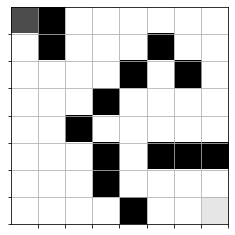

In [293]:
completion_check(model, qmaze)
show(qmaze)

This cell will test your model for one game. It will start the pirate at the top-left corner and run play_game. The agent should find a path from the starting position to the target (treasure). The treasure is located in the bottom-right corner.

DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_game action 2
DEBUG: play_

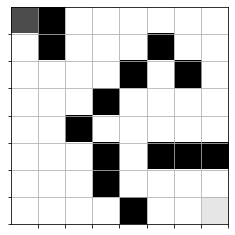

In [294]:
pirate_start = (0, 0)
play_game(model, qmaze, pirate_start)
show(qmaze)

## Save and Submit Your Work
After you have finished creating the code for your notebook, save your work. Make sure that your notebook contains your name in the filename (e.g. Doe_Jane_ProjectTwo.ipynb). This will help your instructor access and grade your work easily. Download a copy of your IPYNB file and submit it to Brightspace. Refer to the Jupyter Notebook in Apporto Tutorial if you need help with these tasks.